---
# Tropical Air Sea Interactions - Final Project
---

In this project I investigate the contribution of ENSO and IOD to East African precipitation in particular Ethiopia. You can jump directly to the load data section. <!--Comments in the code can be skipped, important information will be explicit in markdown.-->

## SET UP ENVIRONMENT

#### Imports

In [2]:
import cftime
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon as MplPolygon
from matplotlib.dates import DateFormatter
import scipy
from scipy import signal
import copy
import os, sys
from IPython.utils.io import capture_output
from tabulate import tabulate
from collections import Counter

from shapely.geometry import Point
import geopandas as gpd

#### Trend, Anomaly functions

In [3]:
def trend(da, dims):
    # Evaluate trend
    p = da.polyfit(dim=dims, deg=1)
    trend = xr.polyval(da[dims], p.polyfit_coefficients)
    return trend
    
def detrend_dim(da, dim, deg=1):
    # Detrend along a single dimension
    p = da.polyfit(dim=dim, deg=deg)
    trend = xr.polyval(da[dim], p.polyfit_coefficients)
    return da - trend

def anom(xarr):
    # Monthly mean anomaly (no-detrend)
    xarr_clm = xarr.groupby('time.month').mean('time')
    xarr_ano = xarr.groupby('time.month') - xarr_clm
    return xarr_ano, xarr_clm

def anomd(xarr):
    # Detrend monthly mean anomaly
    xarr_det = detrend_dim(xarr,'time', deg=1)
    return anom(xarr_det)

def nor(arr):
    return (arr - arr.mean())/arr.std()

#### Covariance, Correlation, (Lag)Regression functions 

In [4]:
# function to evaluate covariance
def npcovariance(FLDtyx, IDXt):
    # Regression map between a field (T,X,Y) and a timeseries (T)
    FLD = FLDtyx - np.mean(FLDtyx, 0)
    IDX = IDXt - np.mean(IDXt)
    FLDdotIDX = np.einsum('kij,k->ij', FLD, IDX)
    cov = FLDdotIDX / IDXt.__len__()
    return cov

# function to evaluate correlation
def npcorrelation(FLDtyx, IDXt):
    # Correlation map between a field (T,X,Y) and a timeseries (T)
    corr = npcovariance(FLDtyx, IDXt) / (np.std(FLDtyx, 0) * np.std(IDXt, 0))
    return corr


# function to evaluate lag correlation
# works with xarray
def nplagcorr(FLDtyx, IDXt, lagmin, lagmax, step):
    # Lag-correlation maps
    # Works only if the absolute value of any lags is smaller than 24
    # evaluation of number of lags
    lags = range(lagmin, lagmax + step, step)
    # initialization of an empty array to store data
    T, Y, X = FLDtyx.shape
    lagcorr = np.zeros([len(lags), Y, X])
    #cycle to fill the array with lag-correlation values
    for i in range(len(lags)):
        lagcorr[i, :, :] = npcorrelation(FLDtyx[24:-24, :], IDXt[24 + lags[i]: -24 + lags[i]])

    tmp = FLDtyx.copy().isel(time=slice(0,len(lags)))
    tmp['time']=lags
    lagcorrxr = tmp.copy(data=lagcorr)
    
    return (lagcorrxr, lags)

#### Density, Spectrum, PC/EOF functions

In [5]:
# function to evaluate pdf
def pdf(bins, ds):
  #creation of the histogram
  hist, bin_edges = np.histogram(ds, bins, density=True)
  #definition of the center of each bin
  bin_center=(bin_edges[0:-1]+bin_edges[1:])/2
  return hist, bin_center

def sel_reg(ds, lat_s, lat_e, lon_s, lon_e): # sTART eND
    # selection of a specific region
    sel_reg = ds.sel(lat=slice(lat_s, lat_e), lon=slice(lon_s, lon_e))
    return sel_reg

# function to evaluate eofs
def eof(ds, lat_s, lat_e, lon_s, lon_e):
  # Prepare empty arrays
  SSTa_EOFs = sel_reg(ds, lat_s, lat_e, lon_s, lon_e).values
  SSTa_EOFs = np.moveaxis(SSTa_EOFs, [0, 2], [2, 0])
  I,J,T = SSTa_EOFs.shape #Get dataset dimensions
  eofs = np.empty((J,I,T))
  pcs = np.empty((T,T))
  #dnew = SSTa_EOFs.reshape((I*J,T))

  norm_cos_lat=True
  if norm_cos_lat:
    [LON,LAT]=np.meshgrid(sel_reg(ds, lat_s, lat_e, lon_s, lon_e).lon,sel_reg(ds, lat_s, lat_e, lon_s, lon_e).lat)
    Wyx=np.cos(np.deg2rad(LAT))
    Wxy=np.moveaxis(Wyx, [0, 1], [1, 0])
    Wxyt=np.tile(Wxy[:,:,np.newaxis], [1,1,T])
    dnew = (Wxyt*SSTa_EOFs).reshape((I*J,T))
  else:
    dnew = SSTa_EOFs.reshape((I*J,T))

  #Select only ocean points (SSTa is not defined over land)
  inan = np.argwhere(~np.isnan(dnew[:,1]))[:,0] #Find sea points
  dnew = dnew[inan,:] #Select only sea points
  
  #Compute covariance-like matrix
  dd = np.matmul(dnew.T,dnew)

  # Extract eigenvectors and eigenvalues
  [lambdas,A] = np.linalg.eig(dd)

  E=np.matmul(dnew,A)#Project data onto eigenvectors
  varexp=100*lambdas/lambdas.sum() #Compute explained variance

  # renormalize to obtain PCs in STD units and EOFs in [°C]
  nmodes=T
  for i in range(T):
    m1=np.empty((I*J))*np.nan
    m1[inan]=E[:,i]
    mstd=np.std(A[:,i])
    eofs[:,:,i]=m1.reshape(I,J).T*mstd
    pcs[:,i]=A[:,i]/mstd
  return (eofs, pcs, varexp)

#### Highlight Area functions

In [6]:
def get_center(reg): # for annotation
    x = (reg[3]-reg[2])/2 + reg[2] -0.5
    y = (reg[1]-reg[0])/2 + reg[0] -0.5
    return (x,y)

# function to highlight a specific area in graphs
def highlight(highlight_extent, color, al = 0.5):
  # Highlighting the specific area
  #highlight_extent = [lon_s, lon_e, lat_s, lat_e] lat_s, lat_e, lon_s, lon_e
  highlight_color = color
  highlight_box = plt.Rectangle((highlight_extent[2], highlight_extent[0]), highlight_extent[3] - highlight_extent[2], highlight_extent[1] - highlight_extent[0], fill=True, facecolor=highlight_color, alpha=al, transform=ccrs.PlateCarree())
  return highlight_box

#### Region Functions

In [7]:
# returns [lat_s, lat_e, lon_s, lon_e] for a given region label
def regions(reg):
    if reg == 'East Africa' or 'Ethiopia': # East Africa
        region = [-10, 20, 25, 55]
    elif reg == 'a':
        region = [9, 20, 25, 34] # Nile, light blue-grey
    elif reg == 'b': 
        region = [0.5, 5.5, 37, 45] # Juba-Shabelle, light yellow
    elif reg == 'c':
        region = [6,11,42,50] # Northeast Coast, light green
    elif reg == 'd': 
        region = [6, 12, 35, 40] # Rift Valley, light red 
    elif reg == 'e': 
        region = [-12, 0, 36, 40] # Central-east Coast, light blue
    elif reg == 'f':
        region = [0, 7, 25,35] # Subnile, 
    elif reg == 'g': 
        region = [-10, 0, 25, 29.5] # West Inland,
    elif reg == 'h':
        region = [-10, 0, 30, 35] # Great Lakes, 
    return region

# returns color for a given region label
def region_color(reg):
    if reg == 'East Africa':
        color = '#E5D95D'
    elif reg == 'a':
        color = '#92A6CC'
    elif reg == 'b':
        color = '#d3bd8f'
    elif reg == 'c':
        color = '#ADBF9B'
    elif reg == 'd':
        color = '#d49096'
    elif reg == 'e':
        color = '#9EBCD3'
    elif reg == 'f':
        color = '#DFADDB'
    elif reg == 'g':
        color = '#EB9E5B'
    elif reg == 'h':
        color = '#69C2BF'
    elif reg == 'Ethiopia':
        color = 'red'
    return color

def make_mask(lat,lon,subregion_polygon):
    # Create an empty mask with the same shape as the latitude and longitude arrays
    mask = np.zeros((len(lat),len(lon)), dtype=bool)

    # Check each point
    for i in range(len(lat)):
        for j in range(len(lon)):
            point = Point(lon[j], lat[i])
            if subregion_polygon.contains(point):
                mask[i, j] = True
    return mask

#### Load CESM data function

In [8]:
# decorater used to block function printing to the console
def blockPrinting(func):
    def func_wrapper(*args, **kwargs):
        with capture_output():
            value = func(*args, **kwargs)
        return value
    return func_wrapper


def load_cesm(*positional_parameters, **keyword_parameters):
    ''' function to load cesm exp.
     S = ctext.cesm(lens,var,period,region,mask)

     Ex. ctext.lens('CESM_noIOD','ts', region=[20,160,20,-60], years=[1950,2000], mask='none')
     Calls:
          1) ctext.cesm(), this shows available data sets
          2) ctext.cesm('CESM_noIOD','ts'), this load all members, all domain, all years
          3) ctext.cesm('CESM_noIOD','ts', region=[20,160,20,-60], years=[1950,2000], res='low', mask='none')
             "res", "region", "years", and "mask" are optional '''

    #------- EDIT THIS BLOCK

    if ('res' in keyword_parameters) and keyword_parameters['res'] != 'full':
        res = 'LowRes'
        print(res)
    else:
        print('Using full resolution')
        res = 'FullRes';

    #drx = '/content/drive/MyDrive/99523_Tropical_AirSea_Interaction/CESM/' + res
    drx = '/home/joy/Documents/TASI/CESM/' + res
    
    #--------END EDIT BLOCK
    nargin = len(positional_parameters)
    if nargin == 0 or (nargin == 1 and res == 'LowRes'):
        print('no args')

        EXP = os.listdir(drx)
        print('Dataset available:')
        print('')
        for mod in EXP[0:]:
            if mod[0] != '.':
                VARS = os.listdir(drx + '/' + mod)
                print(mod)
                for var in VARS[0:]:
                    if var[0] != '.':
                        files = os.listdir(drx + '/' + mod + '/' + var)
                        N = files.__len__()
                        print(var + ': ' + N.__str__() + '  ' + files[0][-12:-8] + '-' + files[0][-7:-3])

    else:
        # for ar in positional_parameters:
        # print(ar)
        mod = positional_parameters[0]
        var = positional_parameters[1]
        files = os.listdir(drx + '/' + mod + '/' + var)

        if ('region' in keyword_parameters):
            print('region: lon:', keyword_parameters['region'][0:2], ' lat:', keyword_parameters['region'][2:])
            region = keyword_parameters['region'][:]
            print(region)
        else:
            print('default region: full domain')
            region = 0;

        if ('years' in keyword_parameters):
            print('years: ', keyword_parameters['years'][0], '-', keyword_parameters['years'][1])
            years = keyword_parameters['years'][:]
            print(years)
            yearINI = str(years[0]).zfill(4) + '-01'
            yearEND = str(years[1]).zfill(4) + '-12'
        else:
            print('default years: all years')

        #this piece is needed as the model name of the netcdf file do not always coincide with mod
        ncfilename = files[0]
        ii = ncfilename.find(var)
        ncnamebase = ncfilename[:ii]
        print(mod)
        memb=1
        locfiles = f'{drx}/{mod}/{var}/{ncnamebase}{var}_R{memb}_{files[0][-12:-8]}-{files[0][-7:-3]}.nc'
        print(locfiles)
        dss = xr.open_dataset(locfiles)

        print('dataset size in GB {:0.2f}\n'.format(dss.nbytes / 1e9))
        out1 = eval('dss.' + var)

        if ('chg_ref_lon' in keyword_parameters):
            print('Changing longitude reference start')
            out1.attrs['ref_lon_changed']='[-180,180]'
            out1 = ctana.xrchgref(out1)

        #add mask
        maskfile = (drx+'/cesm_mask_' + res + '.mat')
        mask = scipy.io.loadmat(maskfile)
        msk = np.transpose(mask['mask'])
        where_are_NaNs = np.isnan(msk)
        msk[where_are_NaNs] = 0
        out1.coords['mask'] = (('lat', 'lon'), msk)


        if ('mask' in keyword_parameters) and keyword_parameters['mask'] != 'none':
            print('Masked field')
            if keyword_parameters['mask'] == 'land':
                out1 = out1.where(msk == 0)
            else:
                out1 = out1.where(msk > 0) #SEA VALUES
        else:
            print('default masking')


        if ('region' in keyword_parameters):

            # determine latitude array orientation
            #s = np.sign(dss['lat'][2].values - dss['lat'][1].values)
            out2 = out1.sel(time=slice(yearINI, yearEND), \
                            lon=slice(region[0], region[1]), lat=slice(region[2], region[3]))

            #s = out2.dims['lat']
            s = out2['lat'].__len__()
            if s == 0:
                out2 = out1.sel(time=slice(yearINI, yearEND), \
                                lon=slice(region[0], region[1]), lat=slice(region[3], region[2]))


        else:
            out2 = out1.sel(time=slice(yearINI, yearEND))

        # Change longitude reference start is required in the call
        # if ('chg_ref_lon' in keyword_parameters):
        #     print('Changing longitude reference start')
        #     out2.attrs['ref_lon_changed']='[-180,180]'
        #     out2 = ctana.xrchgref(out2)

        return out2


@blockPrinting
def load_variable(EXPs, varname):
    regbox=[0,360, -35, 35]
    var = {}
    for EXPNAME in EXPs:
        tmp = load_cesm('CESM_'+ EXPNAME, varname, region=regbox, years=[801, 1000], res='LowRes')
        if EXPNAME == 'AMIP' or EXPNAME == 'CTRL':
            var[EXPNAME]=tmp[1:]
        else:
            var[EXPNAME]=tmp
    return var

#### N34, DMI, Precipitation Index functions

In [9]:
def N34(xarr, lon_shift=0, **keyword_parameters): #takes sst only
    if ('ref_lon_changed' in xarr.attrs):
        lon_shift = -180

    if (xarr.lat[2] < xarr.lat[1]):
        # print('reverse lat orientation')
        N34 = xarr.sel(lat=slice(5, -5), lon=slice(190 + lon_shift, 240 + lon_shift)).mean(dim=('lat', 'lon'), skipna=True)
    else:
        N34 = xarr.sel(lat=slice(-5, 5), lon=slice(190 + lon_shift, 240 + lon_shift)).mean(dim=('lat', 'lon'), skipna=True)
    if ('pp' in keyword_parameters):
        if 'd' in keyword_parameters['pp']:
            # print('Index detrend')
            N34.values = signal.detrend(N34.values)

        if 'z' in keyword_parameters['pp']:
            # print('Index standardized')
            N34.values = (N34.values-N34.values.mean) / np.nanstd(N34.values)
    return N34

def DMI(xarr, **keyword_parameters): #takes sst only
    lon_shift = 0
    if ('ref_lon_changed' in xarr.attrs):
        lon_shift = -180

    if (xarr.lat[2] < xarr.lat[1]):
        IOD1 = xarr.sel(lat=slice(0, -10), lon=slice(90 + lon_shift, 110 + lon_shift)).mean(dim=('lat', 'lon'), skipna=True) # East IO
        IOD2 = xarr.sel(lat=slice(10, -10), lon=slice(50 + lon_shift, 70 + lon_shift)).mean(dim=('lat', 'lon'), skipna=True) # West IO
    else:
        IOD1 = xarr.sel(lat=slice(-10, 0), lon=slice(90 + lon_shift, 110 + lon_shift)).mean(dim=('lat', 'lon'), skipna=True) # East IO
        IOD2 = xarr.sel(lat=slice(-10, 10), lon=slice(50 + lon_shift, 70 + lon_shift)).mean(dim=('lat', 'lon'), skipna=True) # West IO
    IOD = IOD2 - IOD1
    
    if ('pp' in keyword_parameters):
        if 'd' in keyword_parameters['pp']:
            # print('Index detrend')
            IOD.values = signal.detrend(IOD.values)

        if 'z' in keyword_parameters['pp']:
            # print('Index standardized')
            IOD.values = IOD.values / np.nanstd(IOD.values)
    return IOD

# Precipiation Index for a given region, ie value of xarr averaged over reg
def PIEA(xarr, reg, **keyword_parameters): 
    lon_shift = 0

    ll = regions(reg)
    
    if (xarr.lat[2] < xarr.lat[1]):
        PEA = xarr.sel(lat=slice(ll[1], ll[0]), lon=slice(ll[2] + lon_shift, ll[3] + lon_shift)).mean(dim=('lat', 'lon'), skipna=True)
    else:
        PEA = xarr.sel(lat=slice(ll[0], ll[1]), lon=slice(ll[2] + lon_shift, ll[3] + lon_shift)).mean(dim=('lat', 'lon'), skipna=True)
    
    if ('pp' in keyword_parameters):
        if 'd' in keyword_parameters['pp']:
            # print('Index detrend')
            PEA.values = signal.detrend(PEA.values)

        if 'z' in keyword_parameters['pp']:
            # print('Index standardized')
            PEA.values = PEA.values / np.nanstd(PEA.values)
    return PEA

### Composite utilities

In [10]:
def ind_ind(timeseries,stdval):
    pos = timeseries.values > stdval
    neg = timeseries.values < -stdval
    return pos, neg
    
def bool_to_index(iNino_bool): # returns indices from a 0-1 valued array
    iNino = []
    for i in range(len(iNino_bool)):
        if iNino_bool[i] == 1:
            iNino.append(i)
    return iNino, len(iNino)

def filter_consecutive(nums): #  to filter and keep index values that are higher or lower for at least three consecutive months
    result = []
    
    # Iterate through the list, starting from the second element to the second-to-last element
    for i in range(1, len(nums) - 1):
        # Check if the current element is part of three consecutive numbers
        if nums[i-1] == nums[i] - 1 and nums[i+1] == nums[i] + 1:
            result.extend([nums[i-1], nums[i], nums[i+1]])
    
    # Use set to remove duplicates and return a sorted result
    return sorted(set(result))

def index_months(timeseries,stdval):
    pos,neg = ind_ind(timeseries,stdval)
    pos = filter_consecutive(bool_to_index(pos)[0])
    neg = filter_consecutive(bool_to_index(neg)[0])
    return pos, neg

def z_test(fld,comp_idx,conf=0.95):  # two tailed z-test, assuming sample size is large enough so law of large numbers holds.
    z = (fld[comp_idx].mean('time') - fld.mean('time'))/fld.std('time')*np.sqrt(len(comp_idx))
    if conf == 0.80:
        z_conf = 1.281551565545
    elif conf == 0.90:
        z_conf = 1.644853626951
    elif conf == 0.95:
        z_conf = 1.959963984540
    elif conf == 0.99:
        z_conf = 2.575829303549
    return np.abs(z)>z_conf
    
#z_test(anomd(pr_split['amipFULL'][0])[0],bool_to_index(iNino[1])[0],0.95).lon

def stipple(ax,data):   # to stipple the data that passes the z_test ie that is significant at 95%
    #data = z_test(fld,comp_idx,0.95)
    
    lons = data['lon'].values
    lats = data['lat'].values
    
    xs, ys = [], [] #lon, lat
    
    for i in lons:
        for j in lats:
            if data.sel(lon=i,lat=j).values == True:
                xs.append(i)
                ys.append(j)
            
    ax.plot(xs,ys,'.',markersize=3,mec='grey',label='95% confidence' )

## LOAD DATA and NAME VARIABLES

I load both observational and experimental data described in Liguori et al. [2021](https://doi.org/10.1029/2021GL094295) and assign a name to each variable. They are all (dictionaries of) xarrays.

### Observational Data

In [11]:
datadir='/home/joy/Documents/TASI/CESM/LowRes/'
dse=xr.open_dataset(datadir+'ERA5_2D_1958-2022_LowRes_CESM.nc')
#dso=xr.open_dataset(datadir+'ORAS5_1958-2022_LowRes_CESM.nc')

In [12]:
# Converting unit variables (only run once)
dse['t2m']=dse['t2m']-273.15
dse['t2m'] = dse.t2m.assign_attrs(units='°C', long_name='2 meter temperature')
dse['sst']=dse['sst']-273.15
dse['sst'] = dse.sst.assign_attrs(units='°C', long_name='Sea surface temperature')
dse['tp']=dse['tp']*1000*30.5
dse['tp'] = dse.tp.assign_attrs(units='mm', long_name='Total precipitation') # mm accumulated in a month,
#dse['tp']=dse['tp']/3600/24
#dse['tp'] = dse.tp.assign_attrs(units='m/s', long_name='Precipitation rate') # convert so the unit is the same as experiments
dse['d2m']=dse['d2m'][:, 0, :, :]-273.15 # remove expver dimension by selecting version 0
dse['d2m'] = dse.d2m.assign_attrs(units='°C', long_name='2 meter dewpoint temperature')

#dso=dso.rename({'time_counter': 'time'}) #rename dimension time_counter so that it matches ERA5 name for time dimension

In [13]:
# Naming variables for easier use

# ERA5 Variables
#u10 = dse['u10']  # 10 metre U wind component
#v10 = dse['v10']  # 10 metre V wind component
t2m = dse['t2m']  # 2 metre temperature
#msl = dse['msl']  # Mean sea level pressure
sst = dse['sst']  # Sea surface temperature
tp = dse['tp']    # Total precipitation
#d2m = dse['d2m']  # 2 meter dewpoint temperature

# ORAS5 Variables
#ssh = dso['sossheig']  # Sea Surface Height
#isd = dso['so20chgt']  # Depth of 20°C isotherm
#wsi = dso['sozotaux']  # Wind Stress along i-axis

In [14]:
del dse, datadir

In [15]:
dates = sst.time

In [16]:
# set everything to the same time like that addition in xarray works
#ssh['time'] = dates
#isd['time'] = dates
#wsi['time'] = dates

### Model Experiment Data

In [17]:
EXPs=['CTRL', 'amipFULL', 'noENSO', 'amipPACclm', 'noIOD', 'amipIOclm','AMIP']
# amip* : uncoupled
# AMIP : no enso no iod
# amipFULL : control
# amipPACclm : no enso with iod
# amipIOclm : no iod with enso
# (uncoupled have a bias)

ts = load_variable(EXPs, 'ts')   # Surface Temperature [K]
pr = load_variable(EXPs, 'pr')   # Precipitation (Convective Precipitation Rate liquid + ice) [monthly average of m/s]
#psl = load_variable(EXPs, 'psl') # Sea Level Pressure [Pa]

In [18]:
del os

## ANALYSIS CHOICES

### Data Splitting

I split the experimental data into **three 65 year chunks** corresponding to years : 802-866, 867-931, 932-996; I will refer to them as split 0, split 1, split 2. I convert units of the newly split dataarrays so they agree with the observation dataset. Rain or precipitation will be in milimeters accumulated in a month. Surface temperature will be in degrees Celcius.

In [19]:
# Split experiments
def split_exp(ds,rain=False,stemp=False): # return pr['CTRL'][i] an xarray for i = 0,1,2 

    if rain:
        factor = 3600*24*1000*30.5
        k = 0
        attributes = {'units':'mm', 'long_name':'Monthly accumulated precipitation'}
    elif stemp:
        factor = 1
        k = -273.15
        attributes = {'units':'°C', 'long_name':'Surface temperature (radiative)'}
    else:
        factor = 1
        k = 0
        attributes = ds['CTRL'].attrs
    out = {}
    sta_years = np.array([802, 867, 932])
    end_years = np.array([866, 931, 996])
    for EXP in ['AMIP','amipFULL','amipPACclm','amipIOclm','CTRL','noENSO','noIOD']:
        tmp = ds[EXP]
        out[EXP] = {}
        for i in range(3):
            out[EXP][i] = tmp.sel(time=slice(cftime.DatetimeNoLeap(sta_years[i],1,1),cftime.DatetimeNoLeap(end_years[i],12,1)))*factor + k
            out[EXP][i].attrs=(attributes) 
    
    return out

In [20]:
pr_split=split_exp(pr, rain=True) # converted to mm accumulated in a month
ts_split=split_exp(ts, stemp=True) # converted to Celcius
#psl_split=split_exp(psl)

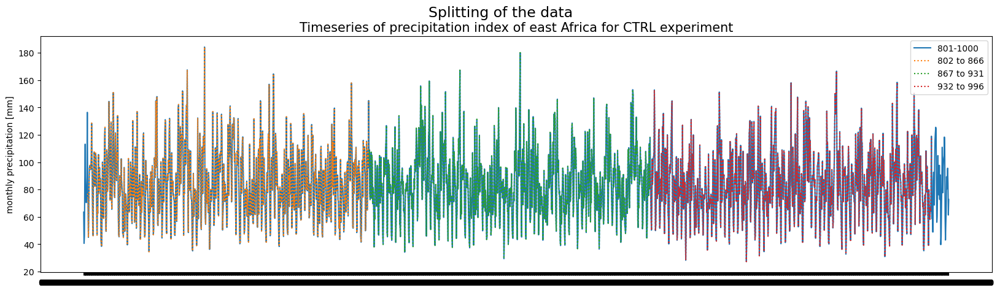

In [20]:
exp = 'CTRL' 
reg = 'East Africa'
labels = ['802 to 866', '867 to 931', '932 to 996']

fig, ax = plt.subplots(figsize=(20,5))

ax.plot(pr[exp].time.astype(str), PIEA(pr[exp]*3600*24*1000*30.5, reg), label='801-1000')  
# pr itself was not converted to mm accumulated in a month so we do it now
for i in range(3):
    time_tmp = pr_split[exp][i].time.astype(str)
    ax.plot(time_tmp, PIEA(pr_split[exp][i], reg), linestyle=':', label = labels[i] )

ax.legend()
ax.set_title(f'Timeseries of precipitation index of east Africa for {exp} experiment', size=15)
ax.set_ylabel('monthly precipitation [mm]')
_=fig.suptitle('Splitting of the data', size = 17)

In [21]:
del time_tmp, labels

### Regions under Investigation and Index Construction

The following map shows our region of interest : east Africa in blue, and Ethiopia's borders in red. It also shows the regions over which we average (sea) surface temperature to obtain the ENSO index (in green) and the IOD index (orange minus yellow).

In [21]:
# Creating mask for Ethiopia
# Load the shapefile
shapefile_path = '/home/joy/Documents/TASI/gadm41_ETH/gadm41_ETH_0.shp'
gdf = gpd.read_file(shapefile_path)
# Print the first few rows to inspect the data
#print(gdf.head())
# Extract the polygon for Ethiopia
ethiopia_polygon =  gdf['geometry'].values[0]

mask_ethio_O = make_mask(tp.lat,tp.lon,ethiopia_polygon)
mask_ethio_E = make_mask(pr['CTRL'].lat,pr['CTRL'].lon,ethiopia_polygon)

In [22]:
del gdf, shapefile_path

In [23]:
# Extract the exterior coordinates
exterior_coords = list(ethiopia_polygon.exterior.coords)
# Create a Matplotlib Polygon patch
mpl_poly_patch = MplPolygon(exterior_coords, closed=True, edgecolor='r', facecolor='none')

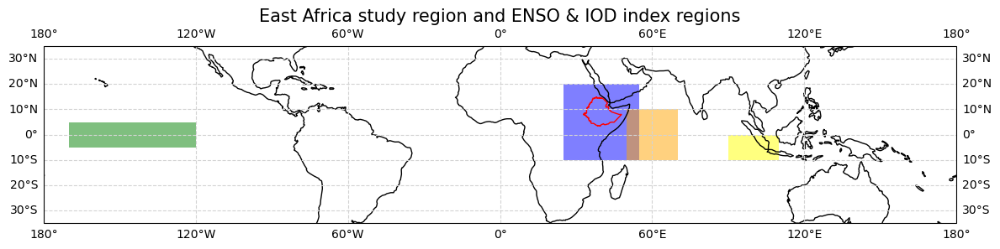

In [25]:
fig = plt.figure(figsize=(14,4))
projection = ccrs.PlateCarree()
ax = plt.axes(projection=projection)
ax.coastlines()
ax.set_extent((-180, 180, -35, 35), crs=projection)
ax.gridlines(color='lightgrey', linestyle='--', draw_labels=True, crs=ccrs.PlateCarree())
ax.set_title('East Africa study region and ENSO & IOD index regions', size=15) # set title
ax.add_patch(highlight([-10, 20, 25, 55], 'blue')) # East Africa
ax.add_patch(highlight([-5, 5, -170, -120], 'green')) # ENSO 3.4 region
ax.add_patch(highlight([-10, 10, 50, 70], 'orange')) # West IO for DMI
ax.add_patch(mpl_poly_patch)
_=ax.add_patch(highlight([-10, 0, 90, 110], 'yellow')) # East IO for DMI

In [23]:
del mpl_poly_patch

In [24]:
# allows to map any field on East Africa, returns the color scale

def map_ea(fld,ax,levs=None,cmap='viridis',draw_labels=True,zoom=False):
    lats = fld['lat']
    lons = fld['lon']

    data,lons=add_cyclic_point(fld,coord=lons)
    cs = ax.contourf(lons,lats,data,transform = ccrs.PlateCarree(),extend='both', levels=levs, cmap= cmap)

    new_patch = MplPolygon(exterior_coords, closed=True, edgecolor='r', facecolor='none')
    ax.add_patch(new_patch)
    if zoom :
        ax.set_extent([32, 49, 2.5, 16])
    else :
        ax.set_extent([25, 55, -10, 20]) 
    ax.coastlines(resolution='auto', color='k')
    gls = ax.gridlines(color='lightgrey', linestyle='-', draw_labels=draw_labels)
    gls.top_labels=False
    gls.right_labels=False
    
    return cs

For studying east African precipitations, I use a **precipitation index (PIEA)** counting accumulated milimeters of precipitation in a month spatially averaged over a specified region. I will look at both the whole **east Africa region**, and at **Ethiopia** more specifically.

The East Africa region (in blue) is not the most precise as it englobes a good part of the Indian ocean.

The reasons for choosing Ethiopia as a subregion are quite arbitrary. I visited Ethiopia in April 2015 but I don't remember much about the rain, other than I think it didn't rain much, maybe once or twice over two weeks. Other reasons for choosing Ethiopia is that I wanted to try using a mask. <!--and that Ethiopia has two rainy seasons which might be more interesting to study. -->

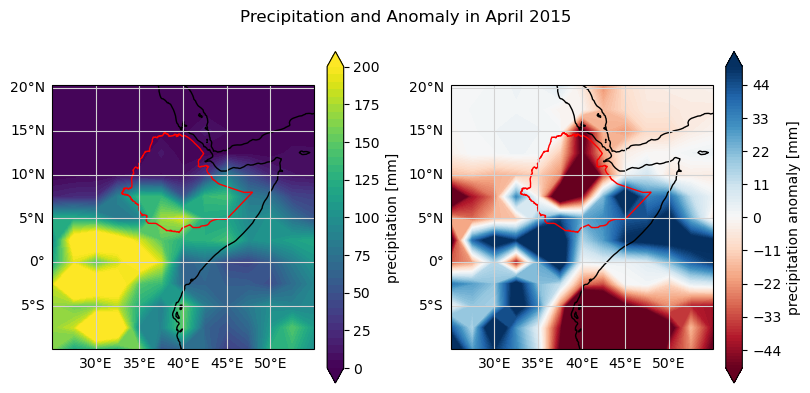

In [28]:
fig, axs = plt.subplots(nrows=1,ncols=2,subplot_kw={'projection': ccrs.PlateCarree()},figsize=(8,4), constrained_layout = True)
# Precipitation
levs = np.arange(0,201,5)
cmap = 'viridis'
cs = map_ea(tp.sel(time = '2015-04-01T00:00:00.000000000'),axs[0],levs=levs, cmap = cmap)
cbar = fig.colorbar(cs, ax= axs[0], orientation='vertical', shrink=0.9, extend='both')
cbar.set_label('precipitation [mm]')

# Anomaly 
levs = np.arange(-50,51,1) 
cmap = 'RdBu'
cs = map_ea(anomd(tp)[0].sel(time = '2015-04-01T00:00:00.000000000'),axs[1],levs=levs, cmap = cmap)
cbar = fig.colorbar(cs, ax= axs[1], orientation='vertical', shrink=0.9, extend='both')
cbar.set_label('precipitation anomaly [mm]')

_=fig.suptitle('Precipitation and Anomaly in April 2015')

In [29]:
del levs, cmap, cs, cbar, fig, axs

<!--explain what iod and enso are in my own words and why they migth have an impact on east africa-->
**El Niño-Southern Oscillation (ENSO)** is a climate phenomenon that affects global weather patterns and has two main phases: El Niño, where sea surface temperatures in the central and eastern Pacific Ocean are warmer than usual, and La Niña, where they are cooler. ENSO influences weather patterns like increased rainfall in some regions and drought in others. The Niño 3.4 index (N34) is commonly used to measure ENSO, based on sea surface temperature anomalies in a specific region of the central Pacific (5°N-5°S, 190°E-240°E). This index helps track the intensity and phase of El Niño and La Niña events.

The **Indian Ocean Dipole (IOD)** is a climate phenomenon characterized by the difference in sea surface temperatures between the western and eastern Indian Ocean. It has two phases: a positive IOD, where the western Indian Ocean is warmer, leading to enhanced rainfall in East Africa and drought in Southeast Asia and Australia; and a negative IOD, with opposite effects. The Dipole Mode Index (DMI) measures IOD by calculating the difference in sea surface temperature anomalies between two regions: the western (near the Arabian Sea) and the eastern Indian Ocean (near Sumatra). This index helps monitor and predict the intensity and phase of the IOD.

Let's find out how these two phenomenon influence rain patterns in East Africa and Ethiopia.

## ANALYSIS

### Some Starting Statistics

In [25]:
# Model Experiments
COUPLED = ['CTRL', 'noENSO', 'noIOD'] 
UNCOUPLED = ['amipFULL', 'amipPACclm', 'amipIOclm','AMIP']

In [31]:
reg = 'East Africa'
print(f'Time averaged {reg} monthly precipitation [mm] (mean, std)') # Table title

def pi_avg(ds):
    avg = int(np.round(np.array(PIEA(ds,reg).mean()), 0))
    std = int(np.round(np.array(PIEA(ds,reg).std()), 0))
    return avg, std

data = [[i] + [pi_avg(pr_split[exp][i]) for exp in COUPLED] for i in range(3)] # split
data.append(["all"] + [pi_avg(pr[exp]*3600*24*1000*30.5) for exp in COUPLED])  # not split
headers = ["Split"]+ COUPLED

print(tabulate(data,headers=headers,tablefmt='grid'))

# Observations
print("Observation",pi_avg(tp))

Time averaged East Africa monthly precipitation [mm] (mean, std)
+---------+----------+----------+----------+
| Split   | CTRL     | noENSO   | noIOD    |
+=========+==========+==========+==========+
| 0       | (84, 25) | (82, 22) | (85, 19) |
+---------+----------+----------+----------+
| 1       | (84, 24) | (83, 23) | (87, 21) |
+---------+----------+----------+----------+
| 2       | (83, 25) | (81, 23) | (85, 20) |
+---------+----------+----------+----------+
| all     | (84, 25) | (82, 23) | (86, 20) |
+---------+----------+----------+----------+
Observation (63, 19)


A few comments :
- First both the mean precipitation and standard deviation (std) of the observation data is lower than that of the experiment data (63 < 84 and 19 < 25). The model is more generous in rain and varies more.  
- When removing ENSO (noENSO), there is less precipitation and std is lower implying that ENSO contributes to both more rain and variability in east Africa. <!--From the coupled experiments it also seems that ENSO contributes to more variability as the std diminishes when removing it.-->
- When removing IOD, there is more precipitation implying that IOD contributes to less rain in east Africa. Variability is also lower and more so than no ENSO : IOD contributes to precipitation variability more so than ENSO does.<!--is increased slightly in the uncoupled experiments and decreased in the coupled experiments.-->

In [32]:
reg = 'Ethiopia'
print(f'Time averaged {reg} monthly precipitation [mm] (mean, std)') # Table title

data = [[i] + [pi_avg(pr_split[exp][i].where(mask_ethio_E)) for exp in COUPLED] for i in range(3)] # split
data.append(["all"] + [pi_avg(pr[exp].where(mask_ethio_E)*3600*24*1000*30.5) for exp in COUPLED])  # not split
headers = ["Split"]+ COUPLED

print(tabulate(data,headers=headers,tablefmt='grid'))

# Observations
print("Observation",pi_avg(tp.where(mask_ethio_O)))

Time averaged Ethiopia monthly precipitation [mm] (mean, std)
+---------+----------+----------+----------+
| Split   | CTRL     | noENSO   | noIOD    |
+=========+==========+==========+==========+
| 0       | (79, 54) | (77, 52) | (82, 53) |
+---------+----------+----------+----------+
| 1       | (79, 53) | (77, 51) | (84, 54) |
+---------+----------+----------+----------+
| 2       | (79, 54) | (76, 52) | (80, 52) |
+---------+----------+----------+----------+
| all     | (79, 53) | (77, 52) | (82, 53) |
+---------+----------+----------+----------+
Observation (62, 41)


In [33]:
del data, headers

The above table looks at Ethiopian precipitation, first we notice that Ethiopia gets less rain than the whole region on average and that its variability is much greater. The comments for East Africa are also valid for Ethiopia, except that IOD has more impact than ENSO on the std, it seems to be the opposite from these values.

Let's dive into the proper analysis to paint of more detailed story.

### Time Series and Cross-Correlation

In [34]:
def plot_ts(rain,stemp,ax2,ax1,ax3,exp):
    pi_ts = PIEA(rain, reg)
    pi_ano, pi_clm = anomd(pi_ts)

    ax1.plot(dates, pi_ts, label = 'raw timeseries')
    ax1.plot(dates,trend(pi_ts,'time'), 'k', label='trend')
    ax1.set_ylabel('[mm]')
    ax1.set_ylim([20,180])
    ax1.legend()
    ax1.set_title(f'Monthly Precipitation ({exp})')

    temp_ts = PIEA(stemp, reg)

    ax2.plot(dates, temp_ts, label= 'raw timeseries')
    ax2.plot(dates,trend(temp_ts,'time'), 'k', label='trend')
    ax2.set_ylabel('[°C]')
    ax2.set_ylim([22,28])
    ax2.legend()
    ax2.set_title(f'Surface Temperature ({exp})')
    

    ax3.plot(dates,pi_ano, 'orange')
    ax3.set_ylabel('[mm]')
    ax3.set_ylim([-50,80])
    ax3.set_title(f'(Detrended) Precipitation Anomaly ({exp})')

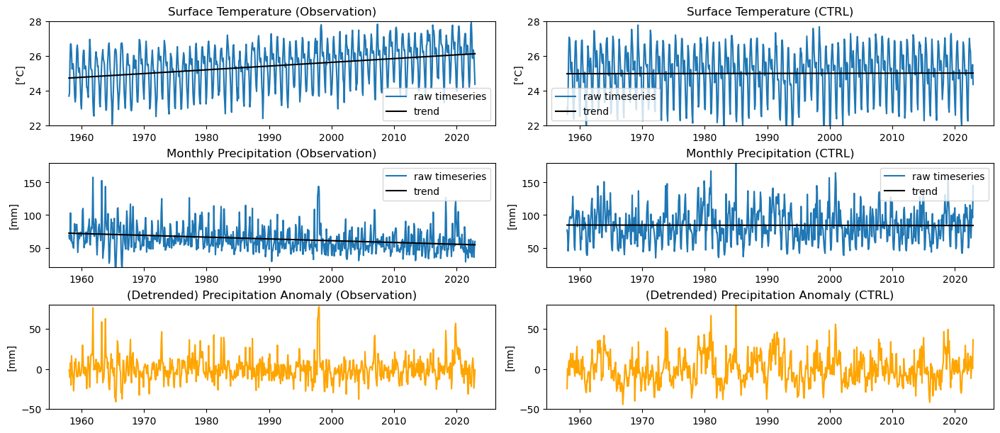

In [35]:
reg = 'East Africa'

fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize=(14,6), constrained_layout = True)

# OBSERVATION
rain = tp # precipitation
stemp = t2m # surface temperature
ax1, ax2, ax3 = axs[0][0], axs[1][0], axs[2][0]

plot_ts(rain,stemp,ax1,ax2,ax3,'Observation')


# EXPERIMENTS
exp = 'CTRL'
i = 0 # first split

rain = pr_split[exp][i] # precipitation
stemp = ts_split[exp][i] # surface temperature
ax1, ax2, ax3 = axs[0][1], axs[1][1], axs[2][1]

plot_ts(rain,stemp,ax1,ax2,ax3,exp)

In [36]:
del rain, stemp

The observation data has a linear trend : less milimeters of rain are falling over east Africa and temperatures rise as time advances; this is climate change. The experimental data has a constant trend.

In [37]:
def time_series_fig(exp,reg,s,obs=False,mask=False):
        
    fig, axs = plt.subplots(nrows=3,ncols=1,figsize=(12,7))

    ax_rain = axs[0]
    ax_temp = axs[1]
    ax_corr = axs[2]
    
    ax_rain.set_ylabel("Precipitation [mm]")
    ax_temp.set_ylabel("Temperature [°C]")
    ax_corr.set_ylabel("Cross Correlation")
    ax_corr.set_xlabel('lag in months')

    if mask:
        tpm = tp.where(mask_ethio_O)
        prsm = pr_split[exp][s].where(mask_ethio_E)
    else:
        tpm = tp
        prsm = pr_split[exp][s]

    sstm = sst
    tssm = ts_split[exp][s]
        
    if obs:
        rain = PIEA(anomd(tpm)[0],reg)
        nino = N34(anomd(sstm)[0])
        iod  = DMI(anomd(sstm)[0])
    else:
        rain = PIEA(anomd(prsm)[0],reg)
        nino = N34(anomd(tssm)[0])
        iod  = DMI(anomd(tssm)[0])
        
    corr1 = signal.correlate(nor(nino),nor(rain), mode='same')/min(len(rain),len(nino))
    corr2 = signal.correlate(nor(iod), nor(rain), mode='same')/min(len(rain),len(iod))
    corr3 = signal.correlate(nor(rain),nor(rain), mode='same')/min(len(rain),len(rain))
    #corr4 = signal.correlate(nino/nino.std(),iod/iod.std(), mode='same')/min(len(nino),len(iod))

    lags = signal.correlation_lags(len(rain), len(nino), mode='same')

    lag = 36
    corr1 = corr1[390-lag:391+lag]
    corr2 = corr2[390-lag:391+lag]
    corr3 = corr3[390-lag:391+lag]
    #corr4 = corr4[390-lag:391+lag]
    lags = lags[390-lag:391+lag]

    maxs = [corr1.max(),corr2.max()]
    
    p1, = ax_rain.plot(dates,rain,label='PIEA',color='green')
    ax_temp.plot(dates,nino,label='N34')
    ax_temp.plot(dates,iod,label='DMI')
    ax_corr.plot(lags,corr3,':',color='green',label='cor(PIEA,PIEA)')
    ax_corr.plot(lags,corr1,label='cor(N34,PIEA)')
    ax_corr.plot(lags,corr2,label='cor(DMI,PIEA)')
    #ax_corr.plot(lags,corr4,label='cor(N34,DMI)')
    
    ax_rain.legend(labelcolor="linecolor")
    ax_temp.legend(labelcolor="linecolor")
    ax_corr.legend(labelcolor="linecolor")
    ax_corr.set_xticks(lags[::3])
    #ax_corr.set_ylim([-1,1])
    
    ax_rain.yaxis.get_label().set_color(p1.get_color())
    return fig,maxs

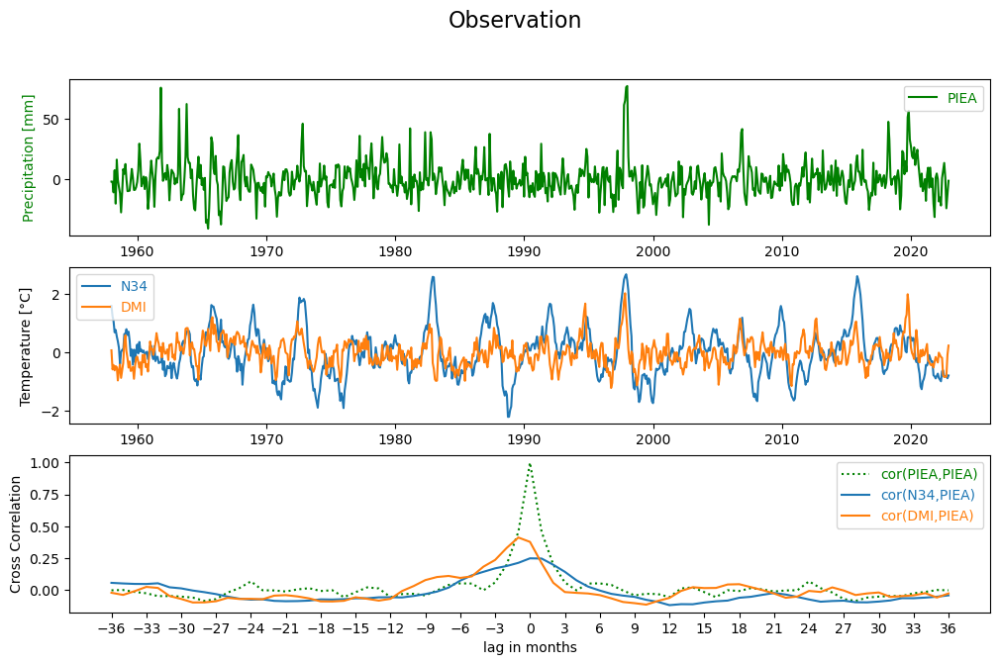

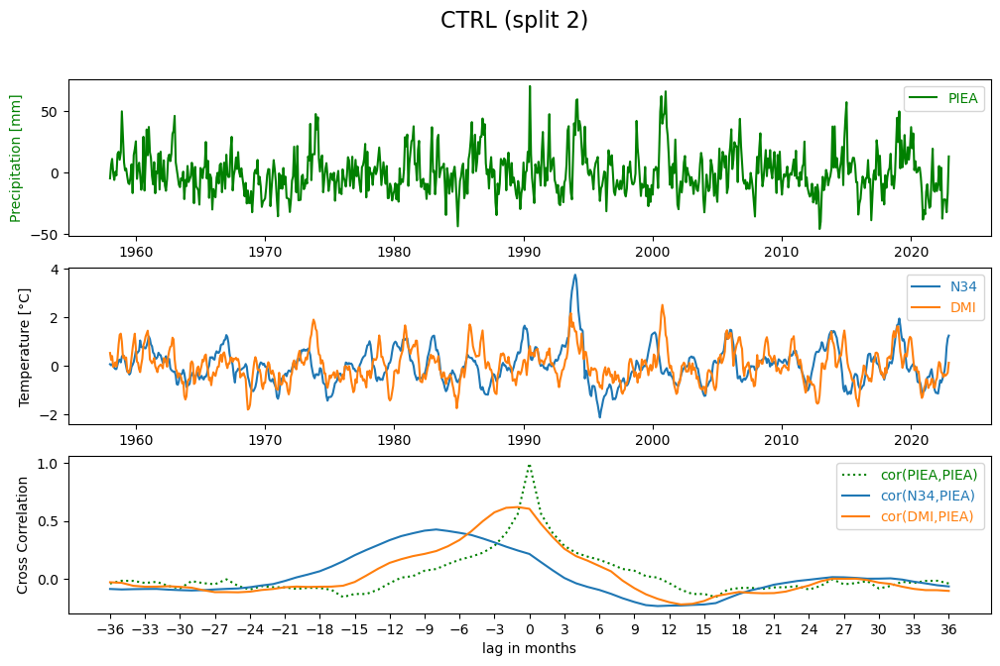

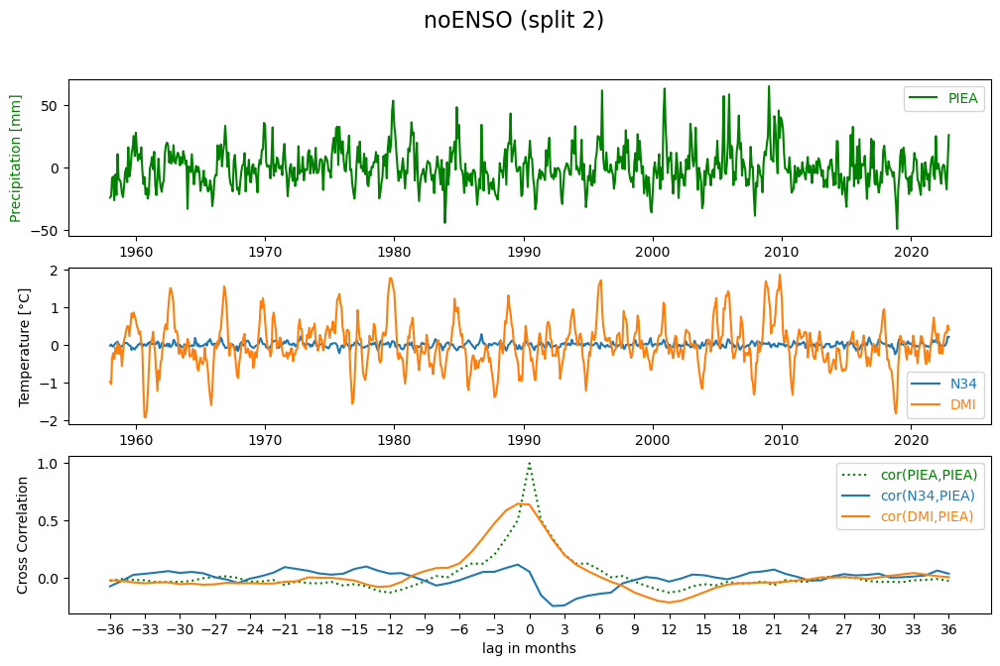

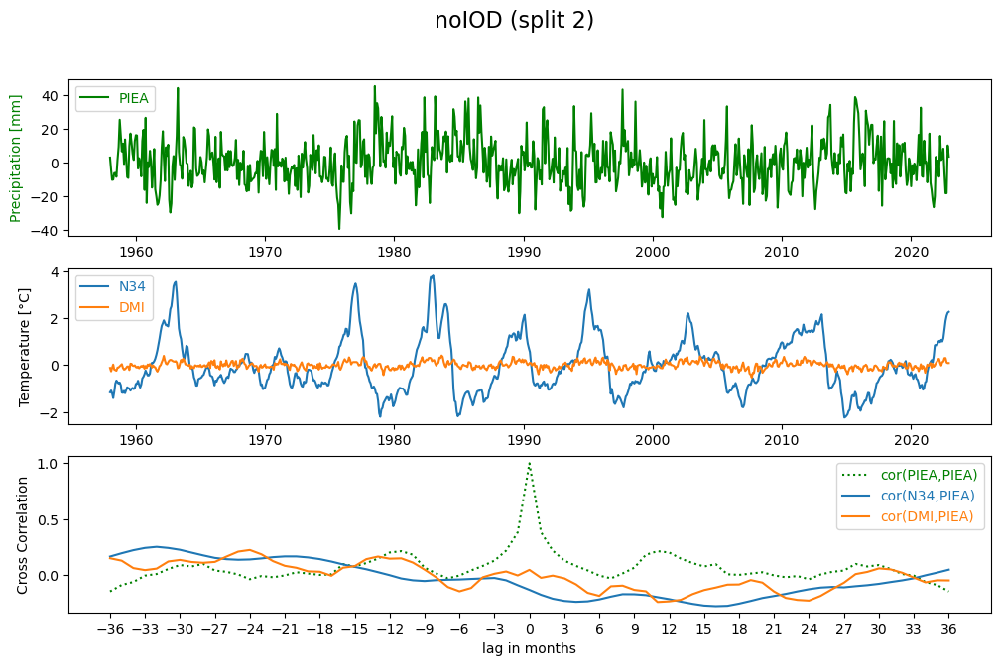

In [38]:
reg = 'East Africa'
s = 2

maxes = []
fig,maxs = time_series_fig(exp,reg,s,obs=True)
fig.suptitle('Observation', fontsize = 16)
maxes.append(maxs)

for exp in COUPLED:
    fig,maxs = time_series_fig(exp,reg,s)
    fig.suptitle(f'{exp} (split {s})', fontsize = 16)
    maxes.append(maxs)

In [39]:
maxes # left column : enso, right column : iod, # lines : obs, CTRL, noENSO, noIOD

[[0.24790100210013283, 0.411240562677359],
 [0.42654603691457266, 0.6204331605819848],
 [0.11741719259927647, 0.6469799541956475],
 [0.25397205894222585, 0.22583241056430556]]

The above figures show, in the first rectangle, the time series of the detrended precipitation anomaly averaged over all of the East Africa region (EA), I will refer to it as PIEA_ts. The second rectangle shows both the Niño-3.4 and DMI index detrended anomaly time series, I will refer to them as N34_ts and DMI_ts. The third rectangle shows the auto-correlation of PIEA_ts, and the cross-correlation of PIEA_ts with N34_ts and DMI_ts. Lags go from -36 months to +36 months ie -3 years +3 years. As expected with no lag, PIEA_ts correlates perfectly with itself. The first figure is for observations the other three are for coupled experiments computed using the 3nd split ie split 2.

When IOD is present (first three lines of right column), peak correlation of DMI_ts with PIEA_ts is quite high occuring at one month lag consistently. This suggests that if DMI is high then about one month later east africa receives more precipitation on average. In the figure for the coupled control, PIEA_ts and N34_ts have a peak correlation of 0.43 at 8 months of lag. When removing ENSO, the correlation between PIEA_ts and N34_ts is, not suprisingly, close to zero. When removing IOD, both correlations are low, this could be because ENSO accentuates IOD so removing IOD also removes the effect of ENSO. I note that in the last figure, the correlation between PIEA_ts and N34_ts is positive for negative lags and negative for positive lags, so even if the correlation is not very high, ENSO_ts always leads PIEA_ts.

Let's look at the same figures for Ethiopia :

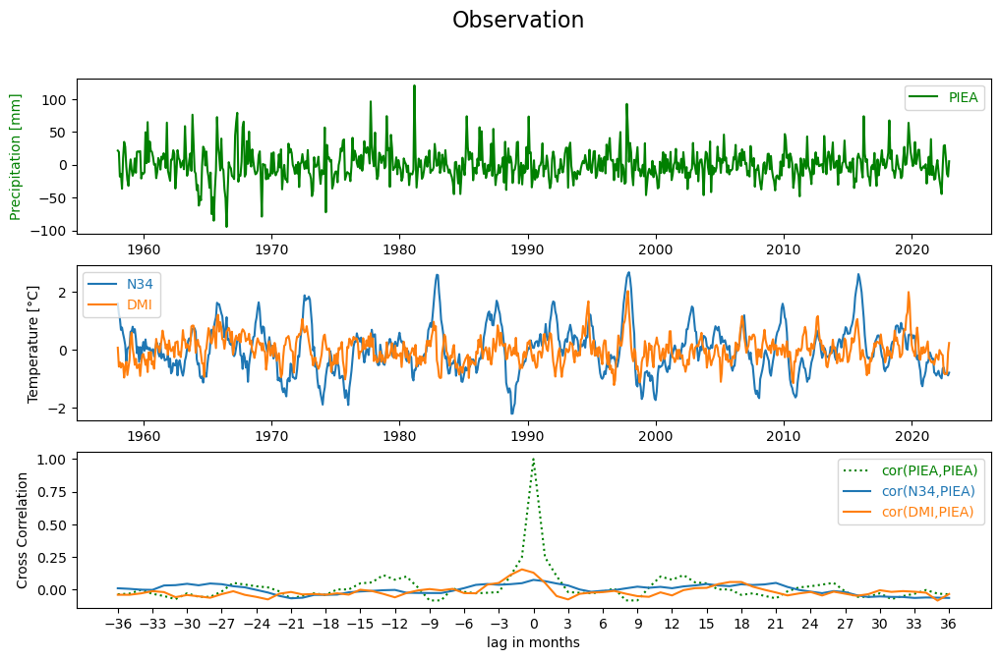

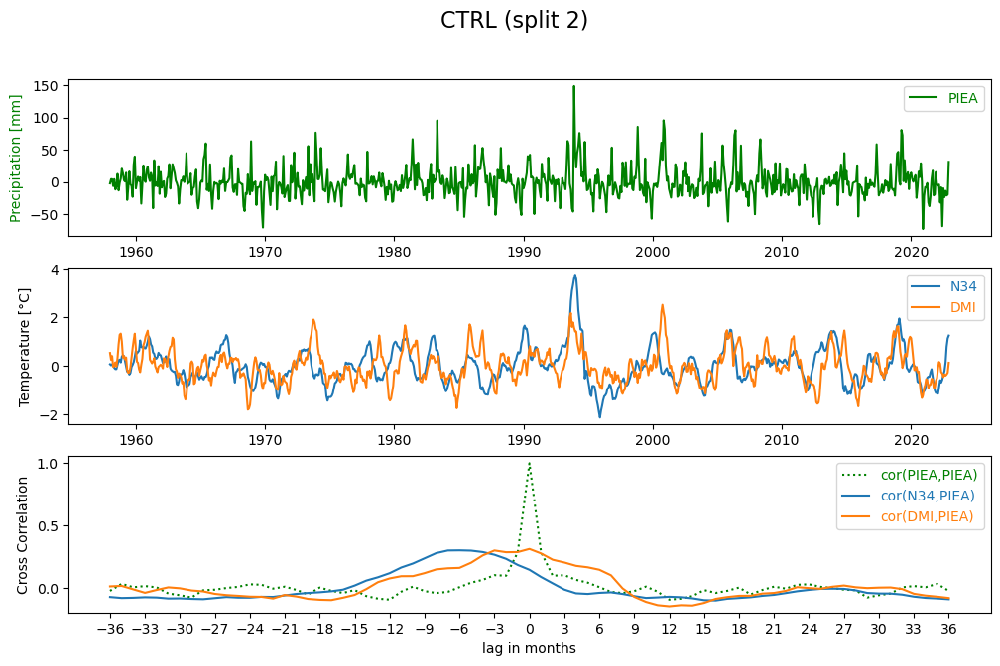

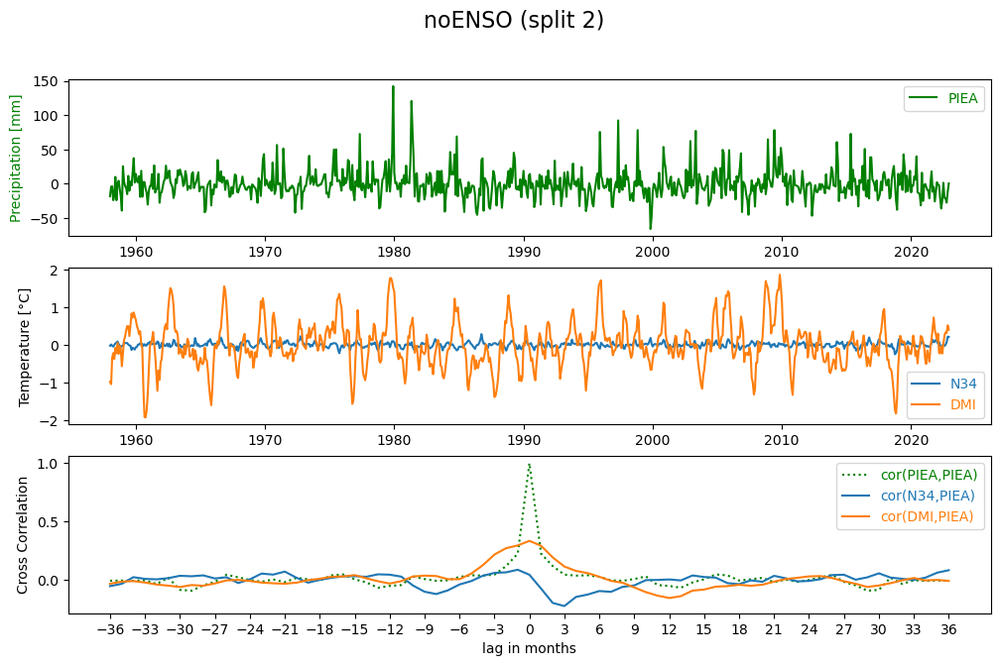

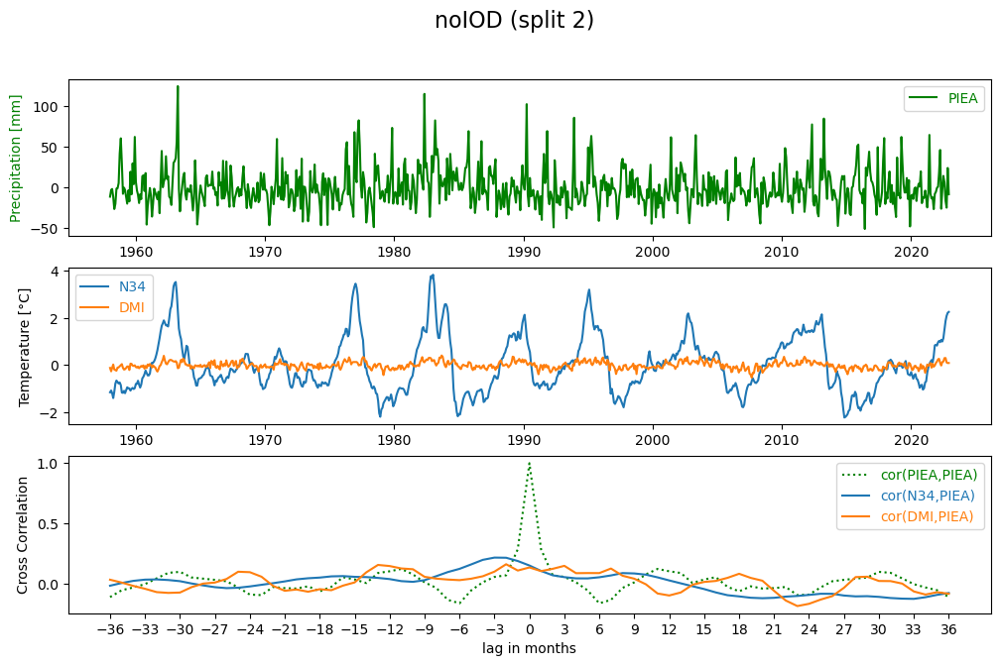

In [40]:
reg = 'Ethiopia'
s = 2

maxes = []
fig,maxs = time_series_fig(exp,reg,s,obs=True,mask=True)
fig.suptitle('Observation', fontsize = 16)
maxes.append(maxs)

for exp in COUPLED:
    fig,maxs = time_series_fig(exp,reg,s,mask=True)
    fig.suptitle(f'{exp} (split {s})', fontsize = 16)
    maxes.append(maxs)

In [41]:
maxes # left column : iod, right column : enso

[[0.07407332516741547, 0.1547933544241558],
 [0.3024653769147503, 0.3136645684131055],
 [0.08591147685365594, 0.3337406978450875],
 [0.21833570540341954, 0.1632432129122073]]

In [42]:
del maxes, maxs

We observe about the same patterns, simply with everything less correlated.

### Seasonal Cycle

In [43]:
def plot_rain_seasonal_cycle(ds_pr,ax,reg,exp,comp_idx=[],mask=False):
    max_pr, min_pr, std_pr = [], [], []
    
    if exp == 'Observation':
        if len(comp_idx) != 0:
            piea_ts = PIEA(ds_pr[index_years(comp_idx)[0]], reg)
        else:
            piea_ts = PIEA(ds_pr, reg)
        piea_month = piea_ts.groupby('time.month')
        piea_clm = piea_month.mean('time')

        for n in range(12):
            max_pr.append(piea_month[n+1].max())
            min_pr.append(piea_month[n+1].min())
            std_pr.append(piea_month[n+1].std())
        
    else: # Model Experiments
        index = np.zeros(12)
        for i in range(3):
            if mask:
                prexpi = ds_pr[exp][i].where(mask_ethio_E)
            else :
                prexpi = ds_pr[exp][i]
            if len(comp_idx) != 0:
                piea_ts = PIEA(prexpi[index_years(comp_idx[i+1])[0]], reg)
            else:
                piea_ts = PIEA(prexpi, reg)
            piea_month = piea_ts.groupby('time.month')
            piea_clm = piea_month.mean('time')
            
            for n in range(12):
                max_pr.append(piea_month[n+1].max())
                min_pr.append(piea_month[n+1].min())
                std_pr.append(piea_month[n+1].std())
            index += piea_clm

        min_pr = np.reshape(min_pr,(3,12)).mean(axis=0)
        max_pr = np.reshape(max_pr,(3,12)).mean(axis=0)
        std_pr = np.reshape(std_pr,(3,12)).mean(axis=0)
        piea_clm = index/3

    ax.plot(piea_clm.month, piea_clm, color = region_color(reg))
    ax.fill_between(piea_clm.month, min_pr, max_pr, alpha=0.4, color = region_color(reg))
    ax.fill_between(piea_clm.month, piea_clm-std_pr, piea_clm+std_pr, alpha=0.6, color = region_color(reg))
    ax.set_title([exp, reg])
    ax.set_ylim([0, 250])
    ax.set_ylabel('precipitation [mm]')
    ax.set_xticks(np.array(range(12))+1)
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])

    return np.mean(std_pr)

 East Africa
Observation std : 15
CTRL std : 17
amipFULL std : 18
noENSO std : 14
amipPACclm std : 18
noIOD std : 13
amipIOclm std : 14
AMIP std : 10
-------------
 Ethiopia
Observation std : 23
CTRL std : 20
amipFULL std : 21
noENSO std : 18
amipPACclm std : 19
noIOD std : 22
amipIOclm std : 24
AMIP std : 16


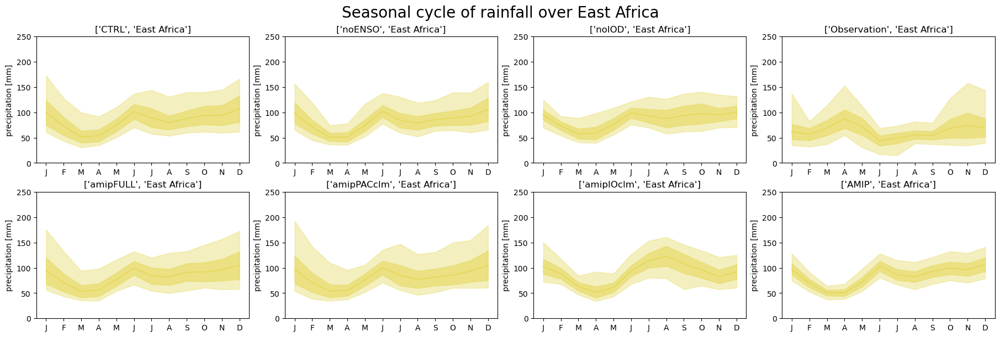

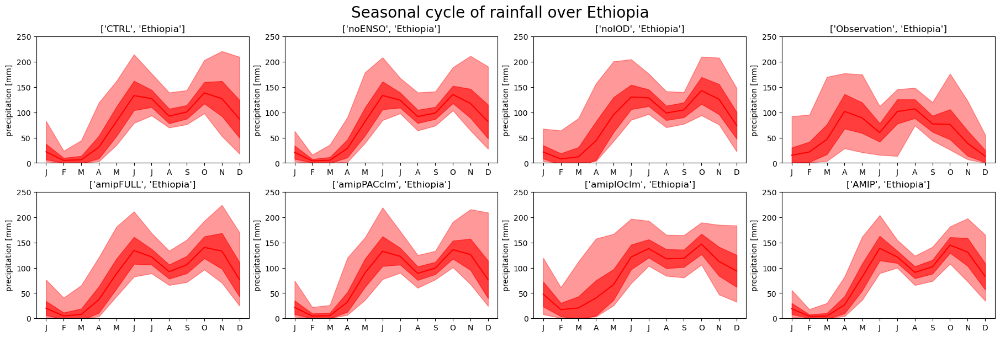

In [44]:
print(' East Africa')
fig, axs = plt.subplots(nrows = 2, ncols = 4, figsize=(18,6), constrained_layout = True)

reg = 'East Africa'

# Observation
ax = axs[0][-1]
std = plot_rain_seasonal_cycle(tp,ax,reg,'Observation')
print('Observation std :',int(np.round(std)))

# Model Experiments

k = 0
for exp in EXPs[0:-1]:
    ax = axs[k%2][k//2]
    std = plot_rain_seasonal_cycle(pr_split,ax,reg,exp)
    print(f'{exp} std :', int(np.round(std)))
    k += 1

ax = axs[1][-1]
std = plot_rain_seasonal_cycle(pr_split,ax,reg,EXPs[-1])
print('AMIP std :', int(np.round(std)))

_=fig.suptitle('Seasonal cycle of rainfall over East Africa', fontsize = 20)



#------------------------------------------------------------------------------------------
print('-------------\n Ethiopia')

fig, axs = plt.subplots(nrows = 2, ncols = 4, figsize=(18,6), constrained_layout = True)

reg = 'Ethiopia'

# Observation
ax = axs[0][-1]
std = plot_rain_seasonal_cycle(tp.where(mask_ethio_O),ax,reg,'Observation',mask=True)
print('Observation std :',int(np.round(std)))

# Model Experiments

k = 0
for exp in EXPs[0:-1]:
    ax = axs[k%2][k//2]
    std = plot_rain_seasonal_cycle(pr_split,ax,reg,exp,mask=True)
    print(f'{exp} std :', int(np.round(std)))
    k += 1

ax = axs[1][-1]
std = plot_rain_seasonal_cycle(pr_split,ax,reg,EXPs[-1],mask=True)
print('AMIP std :', int(np.round(std)))

_=fig.suptitle(f'Seasonal cycle of rainfall over {reg}', fontsize = 20)

The monthly mean climatology or seasonal cycle is ploted for all experiments and observation data, mimicking Palmer et al., [2023](https://doi.org/10.1038/s43017-023-00397-x). All are spatially averaged over East Africa (yellow) and Ethiopia (red). The observation data is averaged over 65 years from 1958 to 2022; the plots for the experimental data are obtained from averaging the average seasonal cycle of each split. The dark envelope denotes the standard deviation of the monthly mean values and the light envelope the range of values. Later we can check wether these peaks correspond to ENSO or IOD peak years.

The graphics show that Ethiopia has two rainy seasons (due to the Intertropical Convergence Zone or ITCZ for short). Comparing the control experiments (both coupled and uncoupled) in the first column and the observation top right, we observe that the rainy seasons in the experiments seem to be shifted: the long rains are shifted from MAM to MJJ, similarly the short rains JAS is shifted to SON. This is probably because the model is theoretical and its physics are slightly different since governed by numerical equations, or maybe the indexing of months was also accidentily shifted. When refering to long and short rain seasons, I will take this shift into account.

The values printed before the figures are the average monthly std (not the std of the whole data set as in Some Starting Statistics).

<!-- This may be because within East Africa some subregions have different seasonal cycles, such as the Nile river basin that has a single rainy season in JAS whereas the Juba-Shabelle river basin region has two distinct rainy seasons (Palmer et al., [2023](https://doi.org/10.1038/s43017-023-00397-x)); a consequence of averaging is that we loose some information and the unimodal season might be enough to seem to shift the bimodal season. Another reason for the observed shift might be because the model was run over a theoretical time . blabla does this mean we have to do analyse on the shifted seasons or not ? we'll see later. -->

For Ethiopia, removing ENSO slightly reduces the std on average (CTRL 20 > noENSO 18) on the other hand, removing IOD slightly increases the std on average (CTRL 20 < noIOD 22).

### Probability Density Functions 

Beneath I plot the probability density functions month by month of the precipitation index for Ethiopia. Each plot contains three months and the yearly pdf. 

In [45]:
def plot_pdf(ds_pr,ax,reg,exp,sm=1,em=12,label=None,anom=False):
    
    if exp == 'Observation':
        if anom:
            index = PIEA(anomd(ds_pr)[0],reg).values
        else:
            index = PIEA(ds_pr,reg).values
        
    else: # Model Experiments
        if anom:
            index = PIEA(anomd(ds_pr[exp].sel(time=slice(cftime.DatetimeNoLeap(802,1,1),cftime.DatetimeNoLeap(996,12,1)))*3600*24*1000*30.5)[0],reg).values
        else:
            index = PIEA(ds_pr[exp].sel(time=slice(cftime.DatetimeNoLeap(802,1,1),cftime.DatetimeNoLeap(996,12,1)))*3600*24*1000*30.5,reg).values
        # here we use directly the whole time series from 802 to 996 rather than extract seperatly all three splits

    subindex = []
    for m in range(sm,em+1):
        subindex.append(index[m-1::12]) 
        
    #creation of the histogram
    if anom:
        bins=np.arange(-100,101,10)
        ylim = [0,0.04]
    else:
        bins=np.arange(0,250,10)
        ylim = [0,0.03]
    hist_pr, bin_center = pdf(bins, subindex)
    ax.plot(bin_center,hist_pr,label=label)
    ax.set_title([exp, reg])
    ax.set_ylim(ylim)
    ax.set_xlabel('mm')

In [26]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

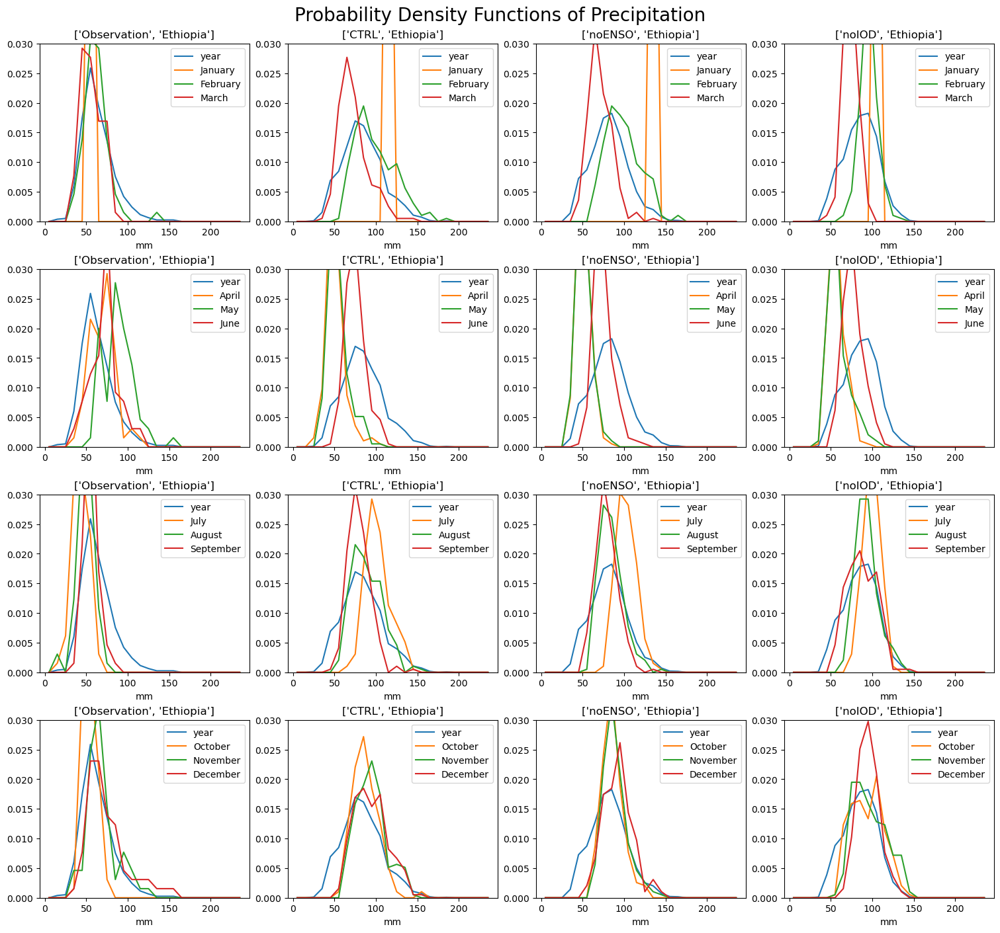

In [47]:
fig, axs = plt.subplots(ncols = 4, nrows = 4, figsize=(15,14), constrained_layout = True)

axs = axs.flatten('F')

reg = 'Ethiopia'

# Observations
for j in range(4):
    ax = axs[j]
    plot_pdf(tp,ax,reg,'Observation',label='year')
    for i, mon in enumerate(months[3*j:3*j+3]):
        plot_pdf(tp,ax,reg,'Observation',sm=i+3*j,em=i+3*j,label=mon)
    ax.legend()


# Model Experiments
n = 0
for exp in COUPLED:
    n += 1
    for j in range(4):
        ax = axs[j+4*n]
        plot_pdf(pr,ax,reg,exp,label='year')
        for i, mon in enumerate(months[3*j:3*j+3]):
            plot_pdf(pr,ax,reg,exp,i+3*j,i+3*j,label=mon)
        ax.legend()
        j+=1
  

_=fig.suptitle('Probability Density Functions of Precipitation',fontsize = 20)

I'll comment month by month comparing between the coupled experiments.

- January : std left unchanged, mean decreases with ENSO, increases with IOD
- February : std slightly greater with ENSO, much greater with IOD, mean mostly unchanged
- March : std slightly greater with ENSO, much greater with IOD, mean mostly unchanged
- April : both mean and std mostly unchanged 
- May : both mean and std mostly unchanged 
- June : both mean and std mostly unchanged 
- July : mean mostly unchanged, std slightly increases with ENSO, and a little more with IOD
- August : mean mostly unchanged with ENSO, and slightly decreases with IOD, std slightly increases with ENSO, and a little more with IOD
- September : mean mostly unchanged, std mostly unchanged with ENSO, decrease with IOD
- October : mean mostly unchanged with ENSO, slightly decreases with ENSO, std increases with ENSO, decreases with IOD
- November : mean mostly unchanged with ENSO, slightly decreases with ENSO, std increases with ENSO, decreases with IOD
- December : mean mostly unchanged, std increases slightly with ENSO, and a little more with IOD
- yearly : both mean and std mostly unchanged 

### Mean and Standard Deviation Fields

In this next section I look at mean and standard deviation fields of both surface temperature and precipitation.

The statistics are done independently on each split, I then average over the three splits. For example, the standard deviation anomaly plots are done taking the anomaly of the first split with respect to the first split mean and then taking the standard deviation of that. Repeat the same process for splits two and three and average over the three output fields. When I look more specifically at certain months say march for example, the process is similar, but I take the anomaly with respect to only the march months mean in the first split and then the standard deviation of that. Again repeat the same process for march months in splits two and three and then average over the three output fields.

<!-- adapt split_avg so that I can look at submonths and select time.  I would like to do this for both rainy seasons and maybe all three 
 rainy sesason for observation we'll see okay no cut the crap.  the std is done completely wrong do it right -->

In [27]:
# Returns xarray of averaged splits given a variable and an experiment.
def split_avg(xarr,exp, anom=False, seltime = [], std = False, avg = True):
    if len(seltime) == 0:
        split1, split2, split3 = xarr[exp][0], xarr[exp][1], xarr[exp][2]
        split1['time'], split2['time'], split3['time']=dates, dates, dates
    else:
        split1, split2, split3 = xarr[exp][0].isel(time=seltime), xarr[exp][1].isel(time=seltime), xarr[exp][2].isel(time=seltime)
        split1['time'], split2['time'], split3['time']=dates.isel(time=seltime), dates.isel(time=seltime), dates.isel(time=seltime)
    
    if anom == True:
        split1 = anomd(split1)[0]
        split2 = anomd(split2)[0]
        split3 = anomd(split3)[0]

    if std == True:
        split1 = split1.std('time')
        split2 = split2.std('time')
        split3 = split3.std('time')

    if avg == True:
        split1 = split1.mean('time')
        split2 = split2.mean('time')
        split3 = split3.mean('time')
        
    data = (split1 + split2 + split3)/3
    #ref = split1
    #avg = xr.DataArray(data = data, coords = ref.coords, dims = ref.dims, name = ref.name) #, attrs = ref.attrs)
    #avg.attrs = ref.attrs
    return data

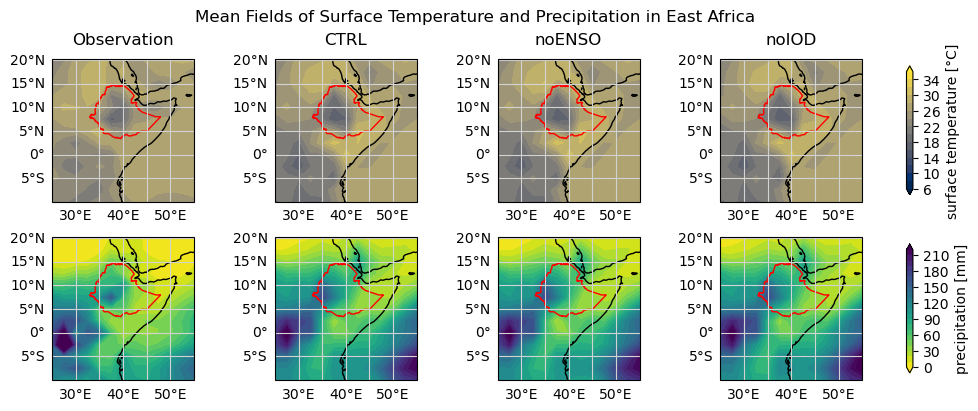

In [49]:
fig, axs = plt.subplots(nrows=2,ncols=4,subplot_kw={'projection': ccrs.PlateCarree()},figsize=(10,4), constrained_layout = True)

# SURFACE TEMPERATURE
levs = np.arange(6,37,2)
ax = axs[0][0]
map_ea(t2m.mean('time'),ax,levs,'cividis') # observation
ax.set_title('Observation')

for i in range(len(COUPLED)): # coupled exps
    ax = axs[0][i+1]
    cs1 = map_ea(split_avg(ts_split,COUPLED[i]),ax,levs,'cividis')
    ax.set_title(f'{COUPLED[i]}')

cbar1 = fig.colorbar(cs1, ax= axs[0][:], orientation='vertical', shrink=0.9, extend='both')
cbar1.set_label('surface temperature [°C]')

# PRECIPITATION
levs = np.arange(0,221,10)
map_ea(tp.mean('time'),axs[1][0],levs,'viridis_r') # observation
for i in range(len(COUPLED)): # coupled exps
    cs2 = map_ea(split_avg(pr_split,COUPLED[i]),axs[1][i+1],levs,'viridis_r')

cbar2 = fig.colorbar(cs2, ax= axs[1][:], orientation='vertical', shrink=0.9, extend='both')
cbar2.set_label('precipitation [mm]')

_=fig.suptitle('Mean Fields of Surface Temperature and Precipitation in East Africa')

At a first glance there is not much difference between the experiments : ENSO and IOD don't change the mean values much. 

<!--When removing IOD, we notice a higher value of precipitation at about 0°N 27°E corresponding to Maiko National Park. -->

Let's look at standard deviation fields :

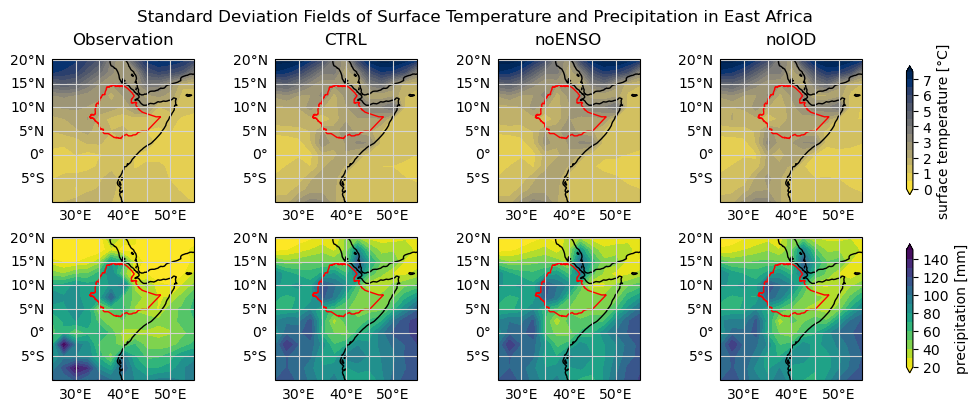

In [50]:
fig, axs = plt.subplots(nrows=2,ncols=4,subplot_kw={'projection': ccrs.PlateCarree()},figsize=(10,4), constrained_layout = True)

# SURFACE TEMPERATURE
levs = np.arange(0,8,0.5)
ax = axs[0][0]
map_ea(t2m.std('time'),ax,levs,'cividis_r') # observation
ax.set_title('Observation')

for i in range(len(COUPLED)): # coupled exps
    ax = axs[0][i+1]
    cs1 = map_ea(split_avg(ts_split,COUPLED[i],std=True,avg=False),ax,levs,'cividis_r')
    ax.set_title(f'{COUPLED[i]}')

cbar1 = fig.colorbar(cs1, ax= axs[0][:], orientation='vertical', shrink=0.9, extend='both')
cbar1.set_label('surface temperature [°C]')

# PRECIPITATION
levs = np.arange(20,151,10)
map_ea(tp.std('time'),axs[1][0],levs,'viridis_r') # observation

for i in range(len(COUPLED)): # coupled exps
    cs2 = map_ea(split_avg(pr_split,COUPLED[i],std=True,avg=False),axs[1][i+1],levs,'viridis_r')

cbar2 = fig.colorbar(cs2, ax= axs[1][:], orientation='vertical', shrink=0.9, extend='both')
cbar2.set_label('precipitation [mm]')

_=fig.suptitle('Standard Deviation Fields of Surface Temperature and Precipitation in East Africa')

Here again the patterns don't seem to drastically change on average. The next two figures show the mean anomaly fields.

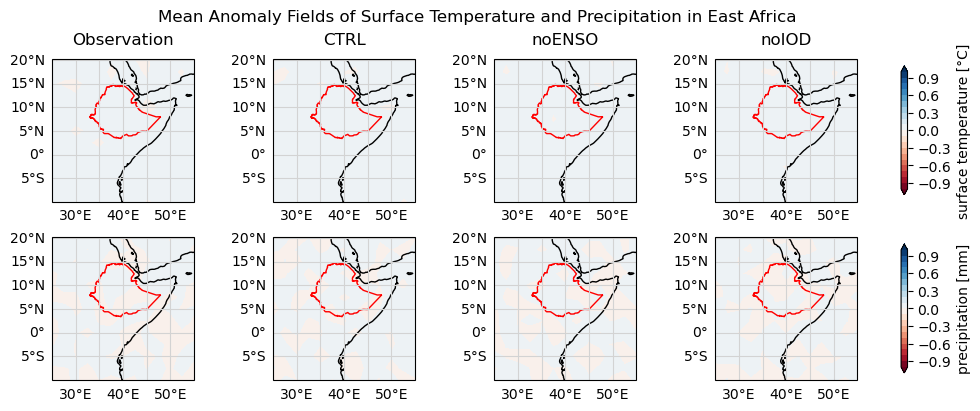

In [51]:
fig, axs = plt.subplots(nrows=2,ncols=4,subplot_kw={'projection': ccrs.PlateCarree()},figsize=(10,4), constrained_layout = True)

# SURFACE TEMPERATURE
levs = np.arange(-1,1.1,0.1)
ax = axs[0][0]
map_ea(anomd(t2m)[0].mean('time'),ax,levs,'RdBu') # observation
ax.set_title('Observation')

for i in range(len(COUPLED)): # coupled exps
    ax = axs[0][i+1]
    cs1 = map_ea(split_avg(ts_split,COUPLED[i],anom=True),ax,levs,'RdBu')
    ax.set_title(f'{COUPLED[i]}')

cbar1 = fig.colorbar(cs1, ax= axs[0][:], orientation='vertical', shrink=0.9, extend='both')
cbar1.set_label('surface temperature [°C]')

# PRECIPITATION
levs = np.arange(-1,1.1,0.1)
map_ea(anomd(tp)[0].mean('time'),axs[1][0],levs,'RdBu') # observation

for i in range(len(COUPLED)): # coupled exps
    cs2 = map_ea(split_avg(pr_split,COUPLED[i],anom=True),axs[1][i+1],levs,'RdBu')

cbar2 = fig.colorbar(cs2, ax= axs[1][:], orientation='vertical', shrink=0.9, extend='both')
cbar2.set_label('precipitation [mm]')

_=fig.suptitle('Mean Anomaly Fields of Surface Temperature and Precipitation in East Africa')

As expected, the mean anomaly fields are null since by definition, the anomaly is the difference from the mean, so averaging just comes back to zero. Let's look at the standard deviation of the anomaly fields :

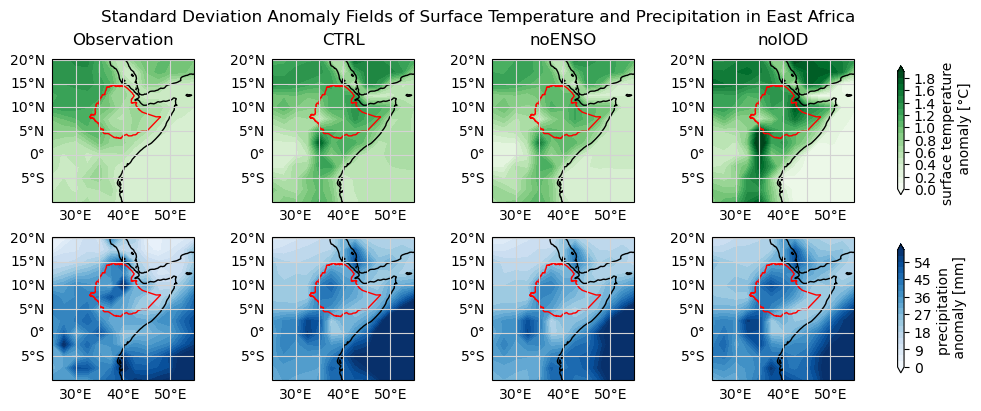

In [52]:
fig, axs = plt.subplots(nrows=2,ncols=4,subplot_kw={'projection': ccrs.PlateCarree()},figsize=(10,4), constrained_layout = True)

# SURFACE TEMPERATURE
levs = np.arange(0,2,0.1)
ax = axs[0][0]
map_ea(anomd(t2m)[0].std('time'),ax,levs,'Greens') # observation
ax.set_title('Observation')

for i in range(len(COUPLED)): # coupled exps
    ax = axs[0][i+1]
    cs1 = map_ea(split_avg(ts_split,COUPLED[i],anom=True,std=True,avg=False),ax,levs,'Greens')
    ax.set_title(f'{COUPLED[i]}')

cbar1 = fig.colorbar(cs1, ax= axs[0][:], orientation='vertical', shrink=0.9, extend='both')
cbar1.set_label(f'surface temperature \n anomaly [°C]')

# PRECIPITATION
levs = np.arange(0,61,3)
map_ea(anomd(tp)[0].std('time'),axs[1][0],levs,'Blues') # observation

for i in range(len(COUPLED)): # coupled exps
    cs2 = map_ea(split_avg(pr_split,COUPLED[i],anom=True,std=True,avg=False),axs[1][i+1],levs,'Blues')

cbar2 = fig.colorbar(cs2, ax= axs[1][:], orientation='vertical', shrink=0.9, extend='both')
cbar2.set_label(f'precipitation \n anomaly [mm]')

_=fig.suptitle('Standard Deviation Anomaly Fields of Surface Temperature and Precipitation in East Africa')

In [53]:
del ax, ax1, ax2, ax3, axs, cbar1, cbar2, fig, cs1, cs2, i, j, k, n, s, levs

Observing the difference in surface temperature we see in the noIOD temperature plot that the anomaly std is greater. The insight gained is that IOD makes surface temperature more predictable. The noENSO temperature plot is lighter than the control, we deduce that ENSO contributes to more temperature variability in East Africa. The same can be observed and deduced for precipitation anomaly.

#### Monthly Statistics Maps for Precipitation

To get a deeper understanding of how ENSO and IOD influence the seasonal cycle of precipitation, I map the mean precipitation, anomaly and standard deviation of the anomaly for each month. 

The colormaps scale allow to compare between experiments but not between months since the scales are adapted to each month. They are built such that the extreme values are those of the 0.02 and 0.98 quantile for the control.

In [54]:
def EthiopiaPrecipitationStatisticsMaps(monthnumber):
    season = np.where((dates['time'].dt.month == monthnumber))[0]
    #season = np.where(mjj)[0]

    # PRECIPITATION MEAN
    fig, axs = plt.subplots(nrows=1,ncols=3,subplot_kw={'projection': ccrs.PlateCarree()},figsize=(10,2), constrained_layout = True)
    axs = axs.flatten()
    
    ctrl = split_avg(pr_split,COUPLED[0],seltime=season).sel(lon=slice(32, 48)).sel(lat=slice(16, 2.5))
    levs = np.linspace(ctrl.quantile(0.02),ctrl.quantile(0.98),15)
    
    #levs = np.arange(0,151,4)
    #map_ea(tp.isel(time=season).mean('time'),axs[0],levs,'viridis_r',zoom=True) # observation
    
    for i in range(len(COUPLED)): # coupled exps
        ax = axs[i]
        cs2 = map_ea(split_avg(pr_split,COUPLED[i],seltime=season),ax,levs,'viridis_r',zoom=True)
        ax.set_title(f'{COUPLED[i]}')
    
    cbar2 = fig.colorbar(cs2, ax= axs[0:4], orientation='vertical', shrink=0.9, extend='both')
    cbar2.set_label('precipitation [mm]')
    
    _=fig.suptitle('Mean Fields of Precipitation in East Africa')


    # PRECIPITATION STD
    fig, axs = plt.subplots(nrows=1,ncols=3,subplot_kw={'projection': ccrs.PlateCarree()},figsize=(10,2), constrained_layout = True)
    axs = axs.flatten()
    
    ctrl = split_avg(pr_split,COUPLED[0],std=True,avg=False,seltime=season).sel(lon=slice(32, 48)).sel(lat=slice(16, 2.5))
    levs = np.linspace(ctrl.quantile(0.02),ctrl.quantile(0.98),15)
    
    #levs = np.arange(0,31,3)
    #map_ea(tp.isel(time=season).std('time'),axs[0],levs,'viridis_r',zoom=True) # observation
    
    for i in range(len(COUPLED)): # coupled exps
        ax = axs[i]
        cs2 = map_ea(split_avg(pr_split,COUPLED[i],std=True,avg=False,seltime=season),ax,levs,'viridis_r',zoom=True)
        ax.set_title(f'{COUPLED[i]}')
    
    cbar2 = fig.colorbar(cs2, ax= axs[0:4], orientation='vertical', shrink=0.9, extend='both')
    cbar2.set_label('precipitation [mm]')
    
    _=fig.suptitle('Standard Deviation Fields of Precipitation in East Africa')
    
    
    # PRECIPITATION STD ANOMALY ---> same as the above because std wrt mean or wrt 0 is the same
    #fig, axs = plt.subplots(nrows=1,ncols=3,subplot_kw={'projection': ccrs.PlateCarree()},figsize=(10,2), constrained_layout = True)
    #axs = axs.flatten()

    #ctrl = split_avg(pr_split,COUPLED[0],anom=True,std=True,avg=False,seltime=season).sel(lon=slice(32, 48)).sel(lat=slice(16, 2.5))
    #levs = np.linspace(ctrl.quantile(0.02),ctrl.quantile(0.98),15)
    
    #levs = np.arange(3,31,3)
    #map_ea(anomd(tp)[0].isel(time=season).std('time'),axs[0],levs,'Blues',zoom=True) # observation
    
    #for i in range(len(COUPLED)): # coupled exps
    #    ax = axs[i]
    #    cs2 = map_ea(split_avg(pr_split,COUPLED[i],anom=True,std=True,avg=False,seltime=season),ax,levs,'Blues',zoom=True)
    #    ax.set_title(f'{COUPLED[i]}')
    
    #cbar2 = fig.colorbar(cs2, ax= axs[0:4], orientation='vertical', shrink=0.9, extend='both')
    #cbar2.set_label(f'precipitation \n anomaly [mm]')
       
    #_=fig.suptitle('Standard Deviation Anomaly Fields of Precipitation in East Africa')


JANUARY


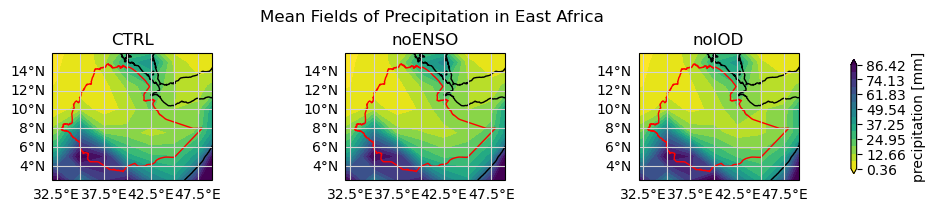

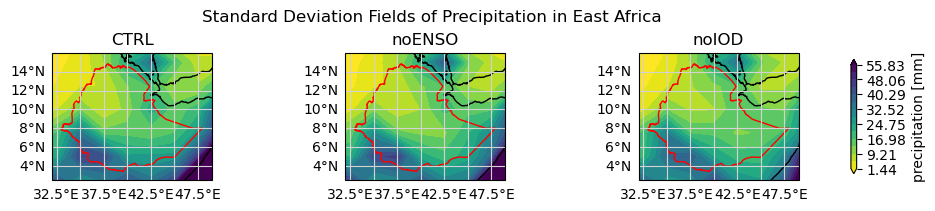

In [55]:
print('JANUARY')
EthiopiaPrecipitationStatisticsMaps(monthnumber=1)

For January, not much changes in between the different experiments.

FEBRUARY


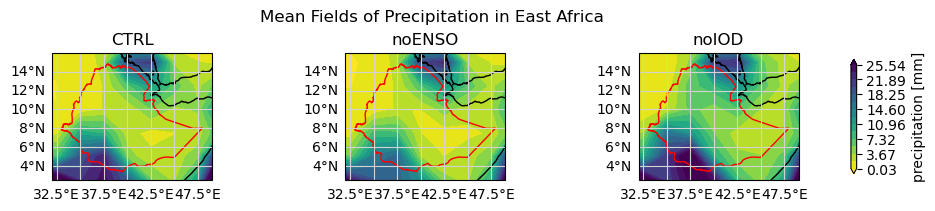

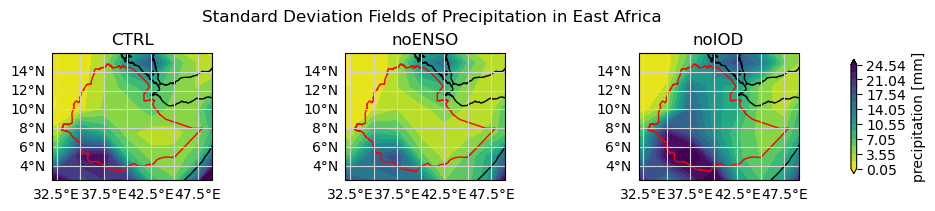

In [56]:
print('FEBRUARY')
EthiopiaPrecipitationStatisticsMaps(monthnumber=2)

For February, we observe that the noIOD plots are darker than the control and the noENSO slightly lighter than the control. When ENSO is present, there is slightly more rain and more variability, when IOD is present, there is less rain and it is more predictable.

MARCH


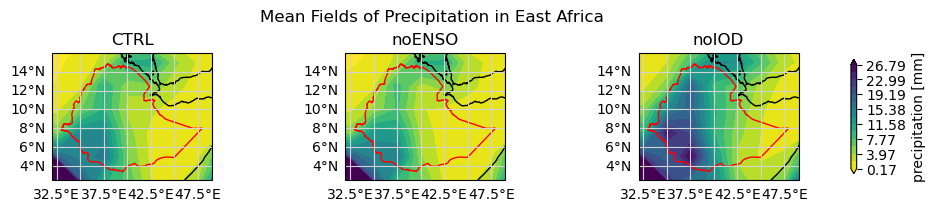

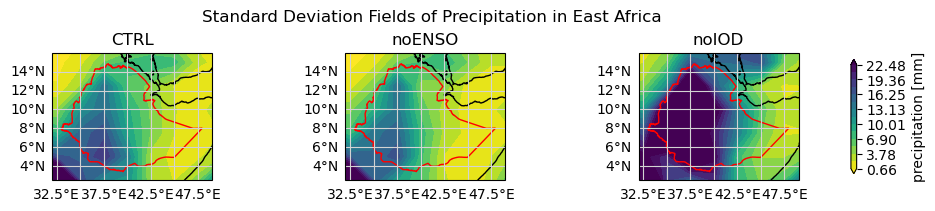

In [57]:
print('MARCH')
EthiopiaPrecipitationStatisticsMaps(monthnumber=3)

For March, we observe that the noIOD std plot is very dark, indicating that the variability especially in west Ethiopia is big without IOD. With IOD on the other hand precipitation is more predictable, the more so when ENSO is removed.

APRIL


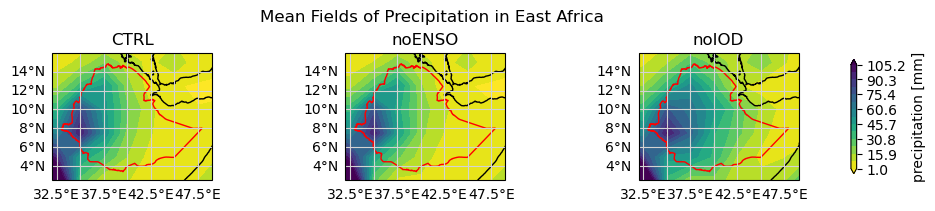

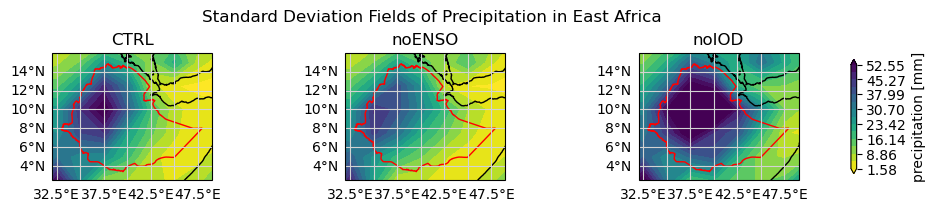

In [58]:
print('APRIL')
EthiopiaPrecipitationStatisticsMaps(monthnumber=4)

For April, we can make a similar observation and deduction, but the rainfall shifts form West to North slightly and the average values and std are quadrupled and doubled respectively.

MAY


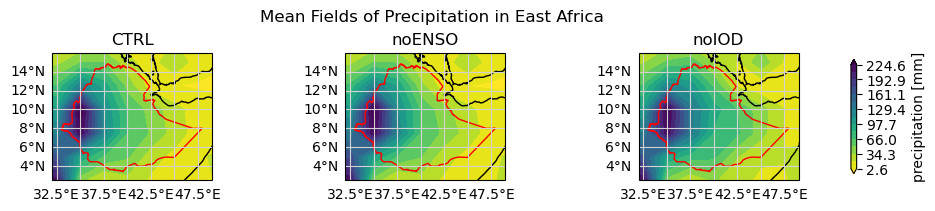

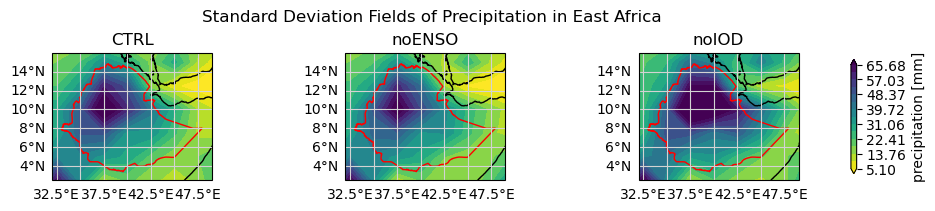

In [59]:
print('MAY')
EthiopiaPrecipitationStatisticsMaps(monthnumber=5)

For May, again similar observations can be made comparing the different experiments. With more rain on average everywhere and greater intensity in the West.

JUNE


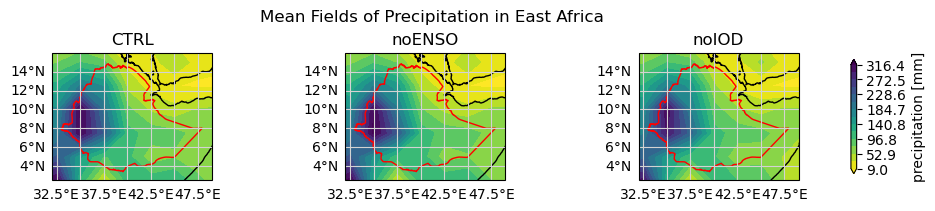

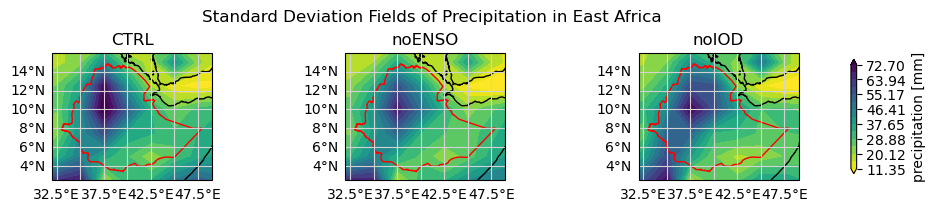

In [60]:
print('JUNE')
EthiopiaPrecipitationStatisticsMaps(monthnumber=6)

For June, both noENSO and noIOD std are lighter than the control std, implying that both ENSO and IOD contribute to increasing the unpredictability of precipitation in this month.

JULY


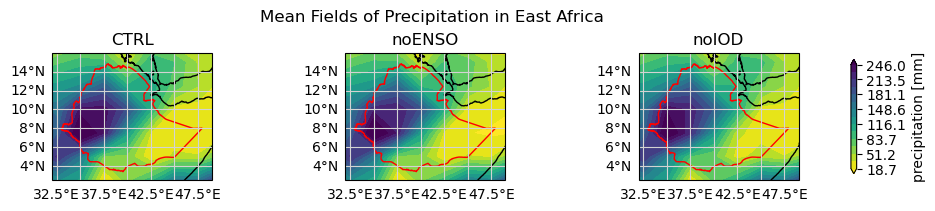

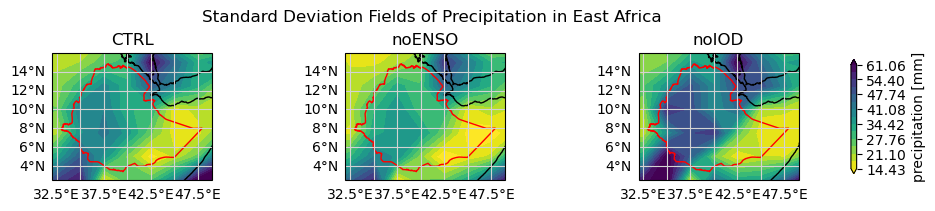

In [61]:
print('JULY')
EthiopiaPrecipitationStatisticsMaps(monthnumber=7)

For July and the next months until November, again we can deduce that IOD decreases the variability and ENSO increases it.

AUGUST


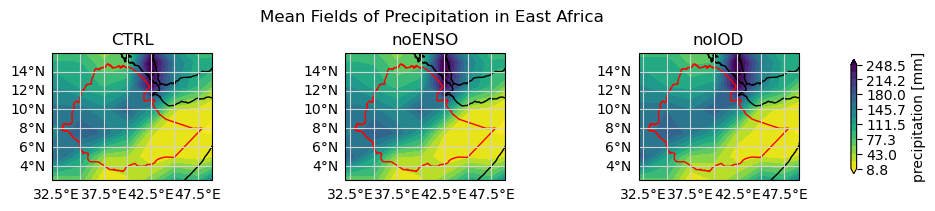

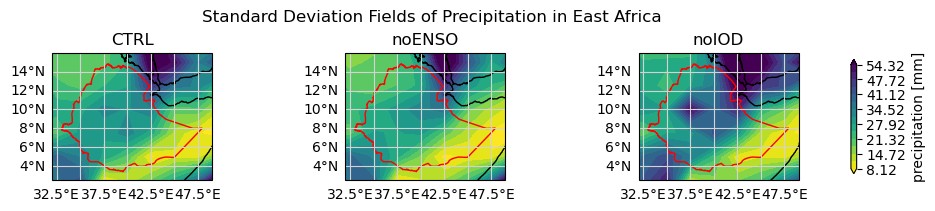

In [62]:
print('AUGUST')
EthiopiaPrecipitationStatisticsMaps(monthnumber=8)

SEPTEMBER


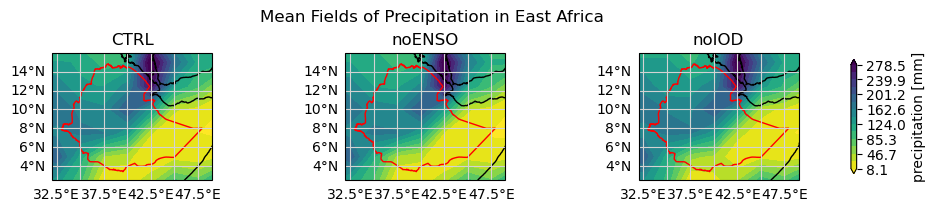

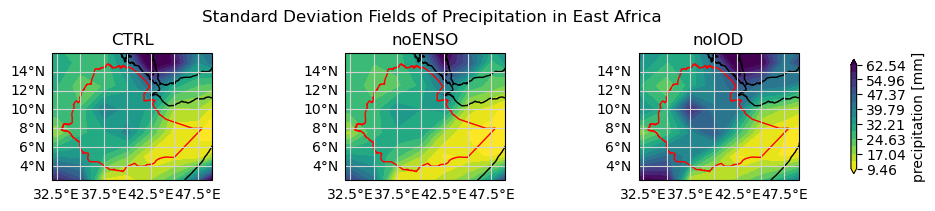

In [63]:
print('SEPTEMBER')
EthiopiaPrecipitationStatisticsMaps(monthnumber=9)

OCTOBER


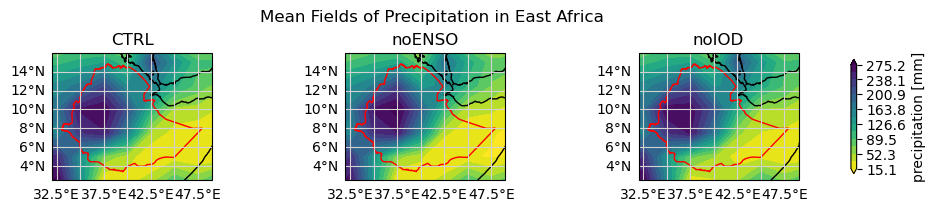

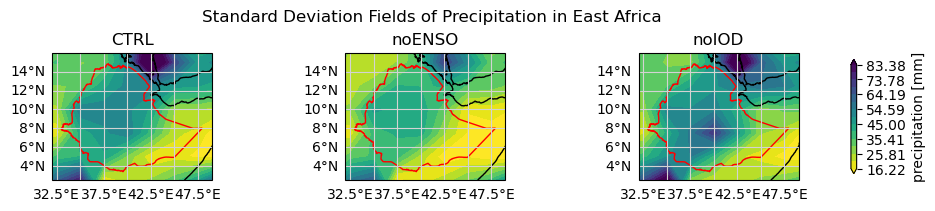

In [64]:
print('OCTOBER')
EthiopiaPrecipitationStatisticsMaps(monthnumber=10)

NOVEMBER


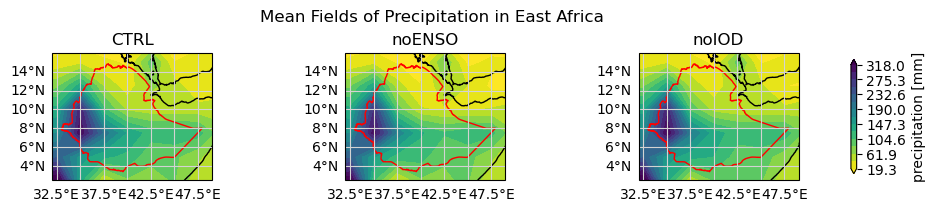

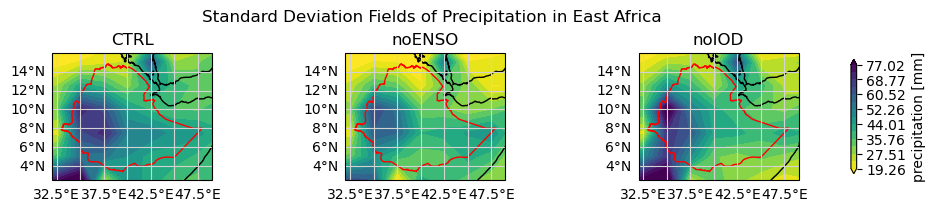

In [65]:
print('NOVEMBER')
EthiopiaPrecipitationStatisticsMaps(monthnumber=11)

DECEMBER


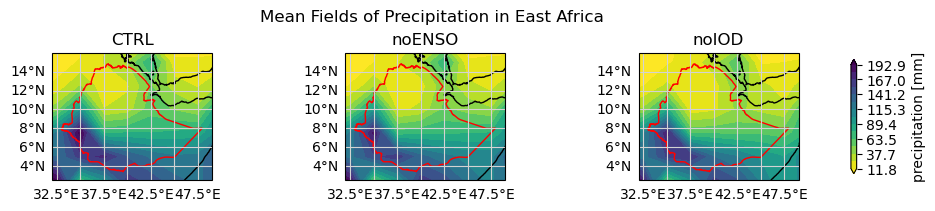

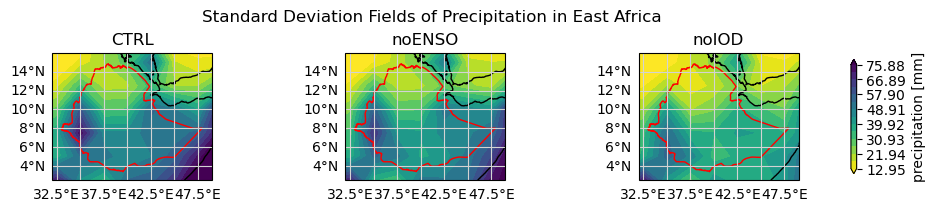

In [66]:
print('DECEMBER')
EthiopiaPrecipitationStatisticsMaps(monthnumber=12)

In December, it seems that IOD contributes to more variability instead and ENSO slightly less. 

<!-- comment and also on long and short season months. maybe comment each month and then do a riassunto 


okay check if std and std anomaly are the same or not ?
could plot difference between experiemtns ie ctrl-noiod and ctrl-noensp0

janvier :
lots of rain (80mm) in south east
std pattern doesn't change much
std anomaly same or maybe slightly more predictable when noIOD
so iod increase variability in jan 

feb:
more rain when no iod 3mmm to 6mm 
more predictable without enso so less predictable with enso the std
IOD makes more predicatble especially in north
same for std anomaly

march:
less rain with iod
lower std with iod
greater std with enso
same std anom

April :
less rain with iod
greater std with enso, lower std with iod

May:
less rain with iod
lower std with iod

June :
lower std with iod

July :
with enso higher std
with iod lower std

August :
with iod lower std
with enso greater std

September :
with iod lower std
with enso greater std

October :
with iod lower std
with enso greater std

November :
with iod lower std
with enso greater std

December -->

Let's now look at correlation maps.

### Correlation and Lag-Correlation Maps

In this section, I map the correlation between precipitation in East Africa and both the N34 and DMi times index time series. I use both coupled and uncoupled experiments here at first.

In [33]:
def fig_correlation(function_index,anomaly=True):
    lagmin, lagmax, step = 0, 0, 1 #Correlation maps
    cmap = 'PiYG'
    levs = np.arange(-0.75,0.76,0.05)
    
    fig, axs = plt.subplots(nrows=2,ncols=4,subplot_kw={'projection': ccrs.PlateCarree()},figsize=(10,5), constrained_layout = True)
    
    axs = axs.flatten('F')

    i = 0
    for exp in UNCOUPLED + COUPLED:
        mapdata = xr.DataArray(0)
        for s in range(3):
            if anomaly:
                rain = anomd(pr_split[exp][s])[0] 
                temp = anomd(ts_split[exp][s])[0] 
            else:
                rain = pr_split[exp][s] 
                temp = ts_split[exp][s] 
            
            enso = function_index(temp)
    
            corr, lags = nplagcorr(rain, enso, lagmin, lagmax, step)
            
            mapdata = mapdata + corr
            
        ax = axs[i]
        map_ea(mapdata[0]/3,ax,levs,cmap)
        ax.set_title(f'{exp}')
        i+=1
    
    rain = anomd(tp)[0]
    temp = anomd(sst)[0]
    enso = function_index(temp)
    mapdata, lags = nplagcorr(rain, enso, lagmin, lagmax, step)
    ax = axs[i]
    cs = map_ea(mapdata[0],ax,levs,cmap)
    ax.set_title('Observation')
    
    cb = fig.colorbar(cs, ax = axs, orientation = 'vertical',shrink = 0.7)
    cb.set_label('|correlation|=<1')
    return fig

#### Correlation with ENSO

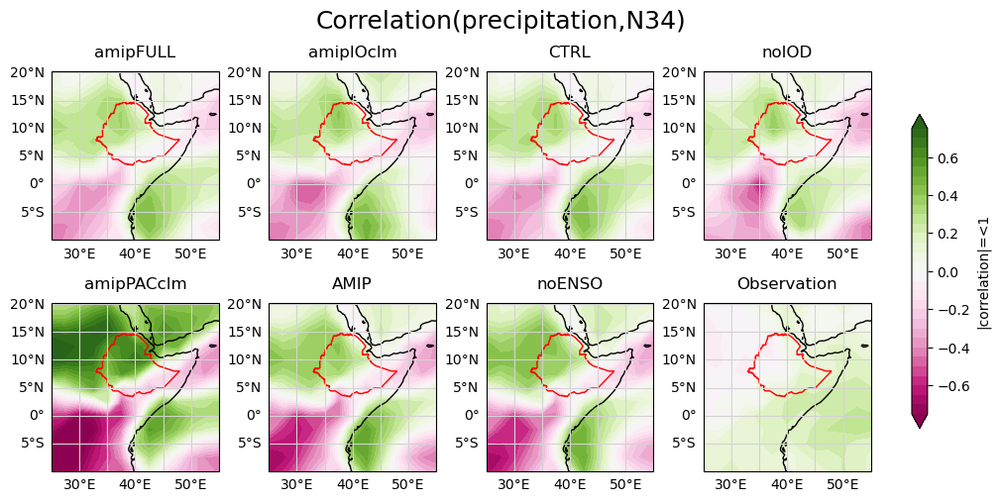

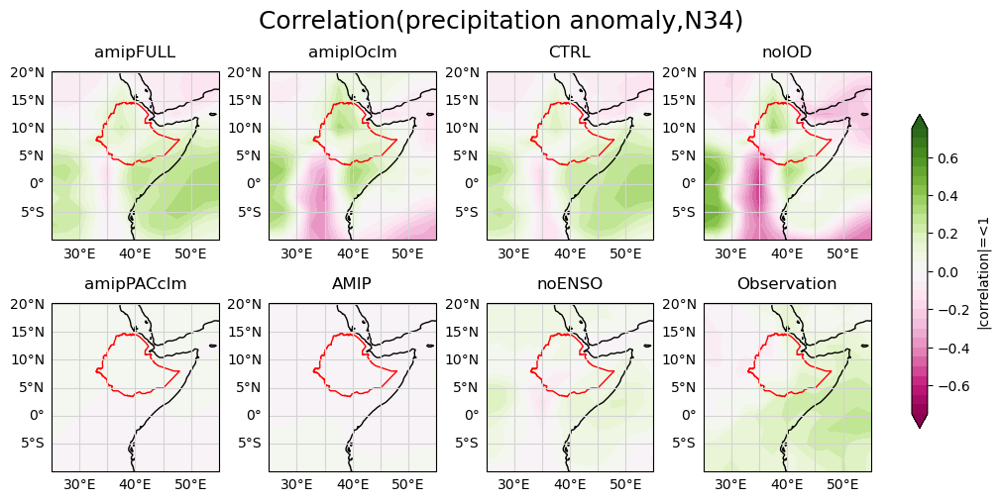

In [68]:
fig = fig_correlation(N34,False)
fig.suptitle('Correlation(precipitation,N34)', fontsize=18)
fig = fig_correlation(N34)
_=fig.suptitle('Correlation(precipitation anomaly,N34)', fontsize=18)

In [69]:
del fig

As expected, removing ENSO results in no correlation between precipitation anomaly in East Africa and the N34 index. This is more observable for the uncoupled experiment so later on we will be using the uncoupled experiments and not the coupled ones. In the amipIOclm and noIOD experiments, we observe that along 35°E, precipitation and N34 are negativelly correlated. Looking at Ethiopia, we observe that the northern part is positively correlated with N34.

#### Correlation with IOD

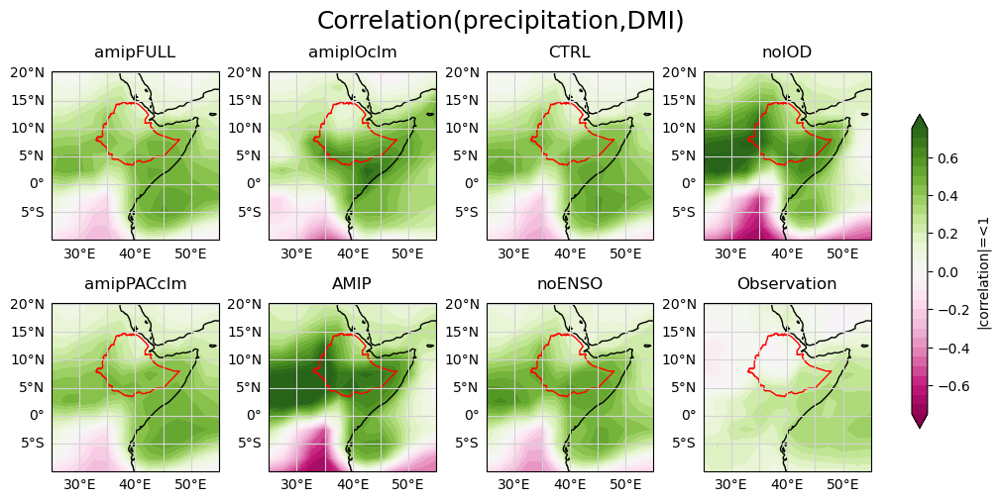

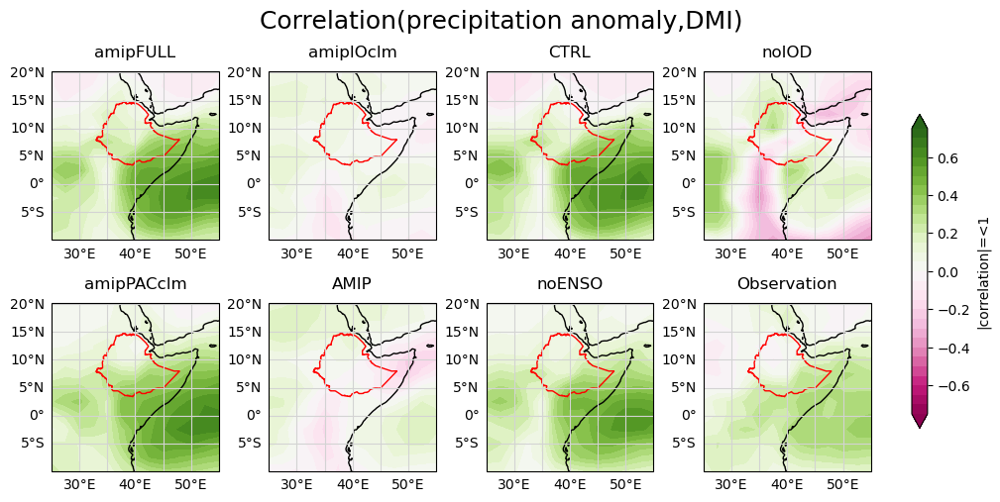

In [34]:
fig = fig_correlation(DMI,False)
fig.suptitle('Correlation(precipitation,DMI)', fontsize=18)
fig = fig_correlation(DMI)
_=fig.suptitle('Correlation(precipitation anomaly,DMI)', fontsize=18)

As expected, amipIOclm has null correlation with DMI. The correlation we observe in noIOD may be because DMI adn N34 are themselves correlated. AmipFULL and amipPACclm are very similar suggesting as can be expected that most of the correlation between IOD and precipitation is not impacted by ENSO. We observe also that in Ethiopia, the correlation is higher in the south east.

In [35]:
del fig

#### Lag Correlation Maps

In [36]:
def fig_lag_correlation(function_index,lagmin, lagmax, step,anomaly=True):
    lags = range(lagmin, lagmax + step, step)
    cmap = 'PiYG'
    levs = np.arange(-0.75,0.76,0.05)
    
    fig, axes = plt.subplots(nrows=len(lags),ncols=len(UNCOUPLED)+1,subplot_kw={'projection': ccrs.PlateCarree()},figsize=(10,2.5*len(lags)), constrained_layout = True)
    
    axs = axes.flatten('F')

    i = 0
    for exp in UNCOUPLED:
        mapdata = xr.DataArray(0)
        for s in range(3):
            if anomaly:
                rain = anomd(pr_split[exp][s])[0] 
                temp = anomd(ts_split[exp][s])[0] 
            else:
                rain = pr_split[exp][s] 
                temp = ts_split[exp][s] 
            
            enso = function_index(temp)
    
            corr, lags = nplagcorr(rain, enso, lagmin, lagmax, step)
            
            mapdata = mapdata + corr

        for n in range(len(lags)):
            ax = axs[i]
            map_ea(mapdata[n]/3,ax,levs,cmap)
            ax.set_title(f'lag = {lags[n]}')
            i+=1
    
    rain = anomd(tp)[0]
    temp = anomd(sst)[0]
    enso = function_index(temp)
    mapdata, lags = nplagcorr(rain, enso, lagmin, lagmax, step)
    for n in range(len(lags)):
        ax = axs[i]
        cs = map_ea(mapdata[n],ax,levs,cmap)
        ax.set_title(f'lag = {lags[n]}')
        i+=1

    for k in range(len(UNCOUPLED)):
        axes[0][k].set_title(f'{UNCOUPLED[k]} \n lag = {lags[0]}')
    axes[0][k+1].set_title(f'Observation \n lag = {lags[0]}')
    
    cb = fig.colorbar(cs, ax = axs, orientation = 'horizontal',shrink = 0.7)
    cb.set_label('|correlation|=<1')
    return fig

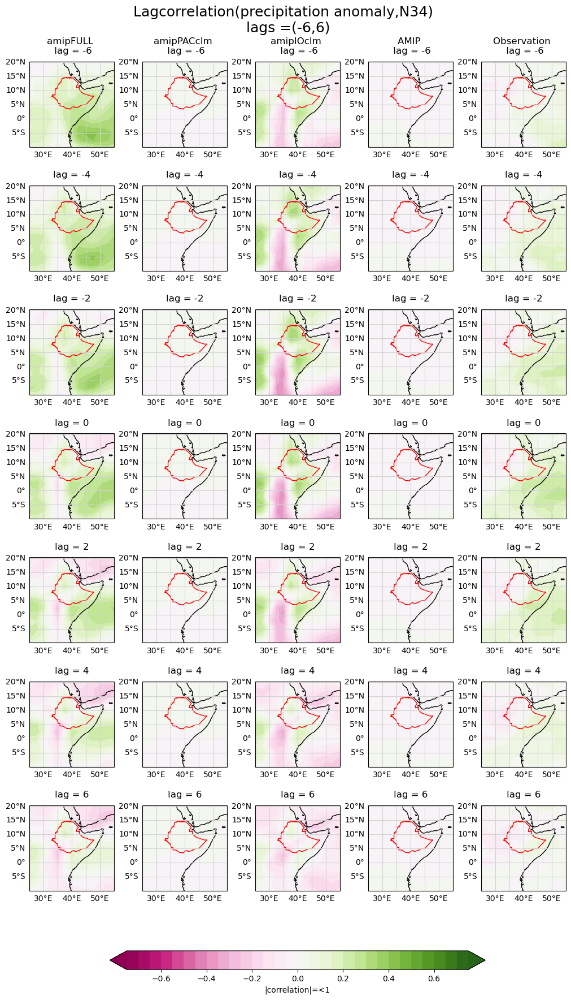

In [37]:
lagmin, lagmax, step = -6, 6, 2
fig = fig_lag_correlation(N34,lagmin, lagmax, step, anomaly=True)
_=fig.suptitle(f'Lagcorrelation(precipitation anomaly,N34) \n lags =({lagmin},{lagmax})', fontsize=18)

On average, N34 leads by about 4 months the precipitation.

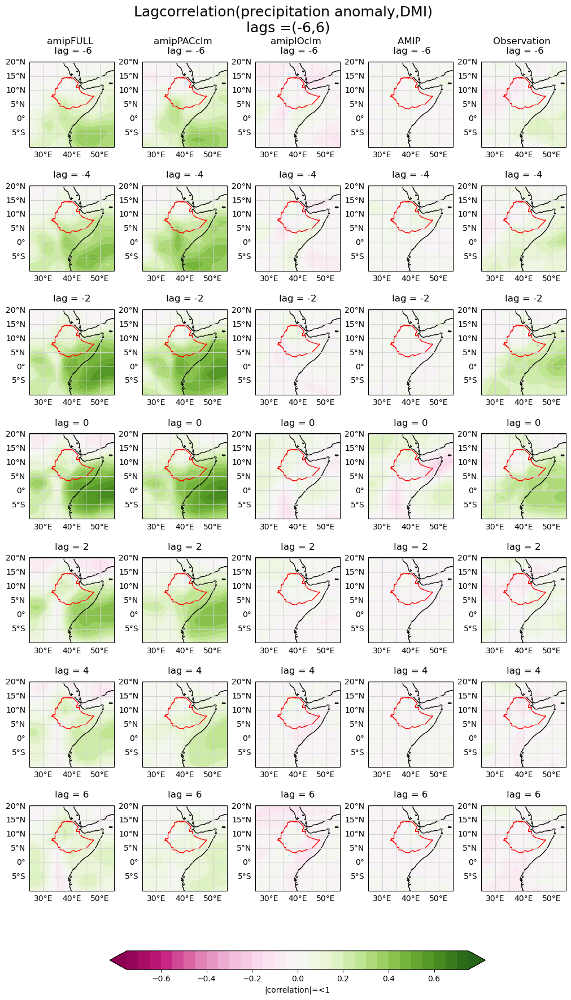

In [38]:
lagmin, lagmax, step = -6, 6, 2
fig = fig_lag_correlation(DMI,lagmin, lagmax, step, anomaly=True)
_=fig.suptitle(f'Lagcorrelation(precipitation anomaly,DMI) \n lags =({lagmin},{lagmax})', fontsize=18)

Similarly, DMI leads precipitation by about 2 months.

Looking at the correlation maps with the std fields instead would have been interesting as well, but I don't this here and go on to look at composites and see what I can learn from them.

In [39]:
del fig, lagmin, lagmax, step

### Composites

In this section I conduct composite analysis. I first need to determine the indices of data corresponding to El Nino, La Nina, positive IOD and negative IOD years.

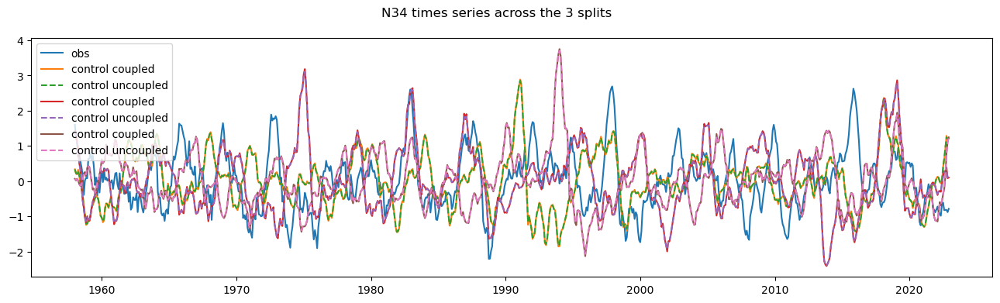

In [28]:
fig, ax = plt.subplots(figsize=(16,4))

# Taking CTRL or amipFULL is equivalent

nino = N34(anomd(sst)[0]) # observation
ax.plot(nino.time,nino,label='obs')

for i in range(3): # splits of experiments
    ninoz = N34(anomd(ts_split['CTRL'][i])[0])
    ax.plot(nino.time,ninoz,label='control coupled')
    ninoz = N34(anomd(ts_split['amipFULL'][i])[0])
    ax.plot(nino.time,ninoz,'--',label='control uncoupled')

fig.suptitle('N34 times series across the 3 splits')

_=ax.legend()

As expected from how the coupled and uncoupled experiments were built, taking 'CTRL' or 'amipFULL' to determine El Nino years makes no difference. The same is true for IOD.

Let's determine el Nino, la Nina, positive IOD and negative IOD years :
<!--- here think about the good definition of el nino years and la nina 
 seperate el nino and la nina same for iod
 check wether the peaks in seasonal cycle correpond to such years.-->

In [29]:
# Function for ploting nino and iod time series

def plot_climate_index(ax,xr_sst,func,stdval=None,cp='r',cn='b'):
    nino = func(anomd(xr_sst)[0]) # detrended monthly mean anomaly
    if stdval == None:
        stdval=nino.std().values*1.5 # standard deviation
    [iNino, iNina] = index_months(nino,stdval)
    
    ax.plot(dates,nino)
    
    ax.plot(dates,np.ones(len(dates))*stdval, f'{cp}--') # 1.5 std : el Nino threshold
    ax.plot(dates,-np.ones(len(dates))*stdval, f'{cn}--') # -1.5 std : la Nina threshold

    ax.plot(dates[iNino],nino[iNino],f'{cp}o',label='Niño')
    ax.plot(dates[iNina],nino[iNina],f'{cn}o',label='Niña')

    ax.set(xlabel="time", ylabel="Temperature [°C]")

    def temp2std(x):
        return x/stdval

    def std2temp(x):
        return x*stdval
        
    ax2 = ax.secondary_yaxis('right', functions=(temp2std, std2temp))
    ax2.set_ylabel('std')
    ticks = np.arange(-4,5)
    ax2.set_yticks(ticks)
    
    return iNino, iNina

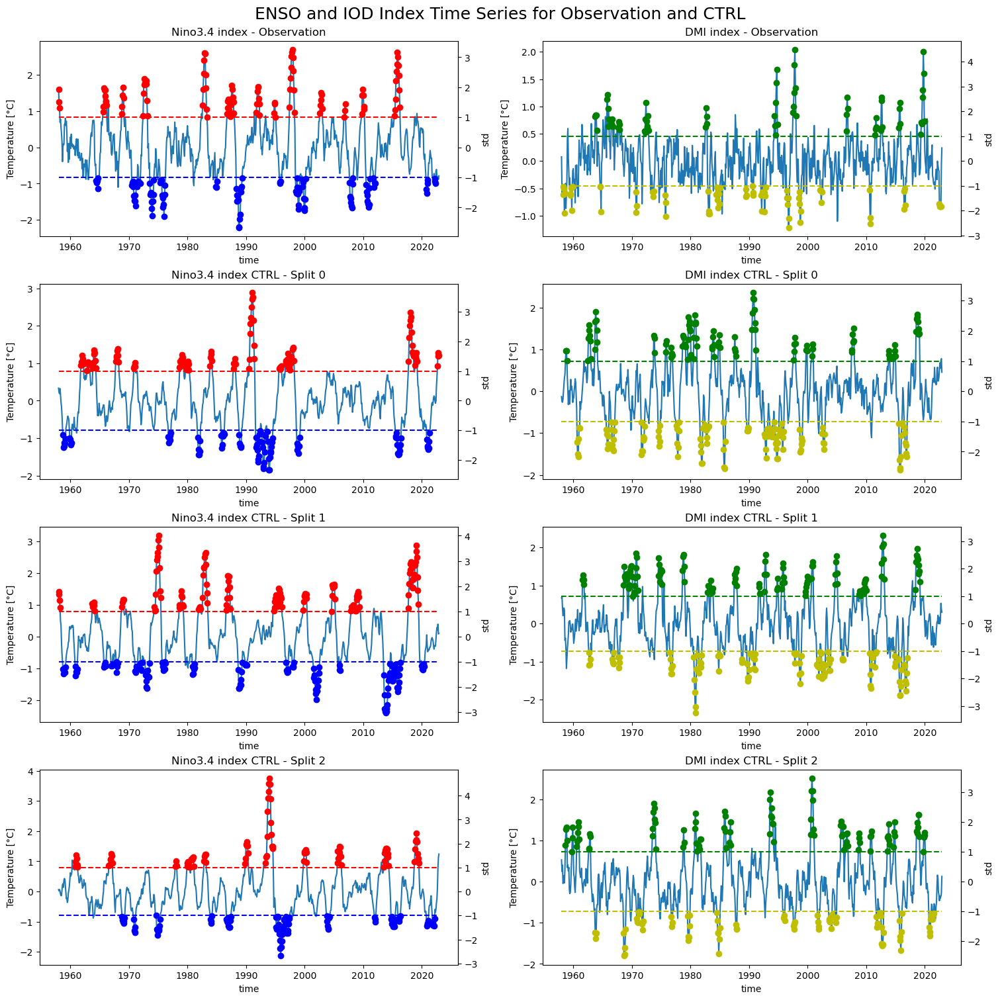

In [30]:
fig, axs = plt.subplots(nrows=4 , ncols=2 , figsize=(15,15), constrained_layout = True) 

# store index years : row 0 is observations, subsequent are the three splits for control experiment
# OBSERVATION and CTRL
iNino = [] #np.zeros([4,780]) 
iNina = [] #np.zeros([4,780])
iPosIOD = [] #np.zeros([4,780])
iNegIOD = []#np.zeros([4,780])

axs = axs.flatten('F')

#  observation
o,a = plot_climate_index(axs[0],sst,N34, N34(anomd(sst)[0]).std().values*1)#plot_nino_years(axs[0][0],sst)
iNino.append(o)
iNina.append(a)
axs[0].set_title("Nino3.4 index - Observation")
p,n = plot_climate_index(axs[4],sst,DMI, DMI(anomd(sst)[0]).std().values*1,cp='g',cn='y')
iPosIOD.append(p)
iNegIOD.append(n)
axs[4].set_title("DMI index - Observation")

# control experiment
exp = 'CTRL'
N34std = N34(anomd(ts[exp])[0]).std().values*1#.5 # have the same std value across all three splits
DMIstd = DMI(anomd(ts[exp])[0]).std().values*1 
for i in range(3):
    o,a = plot_climate_index(axs[i+1], ts_split[exp][i],N34,N34std,cp='r',cn='b') #axs[(2*i+2)%4][(i*i)%3]
    iNino.append(o)
    iNina.append(a)
    axs[i+1].set_title(f"Nino3.4 index CTRL - Split {i}") #(2*i+2)%4][(i*i)%3
    p,n = plot_climate_index(axs[5+i], ts_split[exp][i],DMI,DMIstd,cp='g',cn='y') #axs[(2*i+3)%4][(i*i)%3]
    iPosIOD.append(p)
    iNegIOD.append(n)
    axs[5+i].set_title(f"DMI index CTRL - Split {i}") #(2*i+3)%4][(i*i)%3]

_ = fig.suptitle('ENSO and IOD Index Time Series for Observation and CTRL', size = 18)

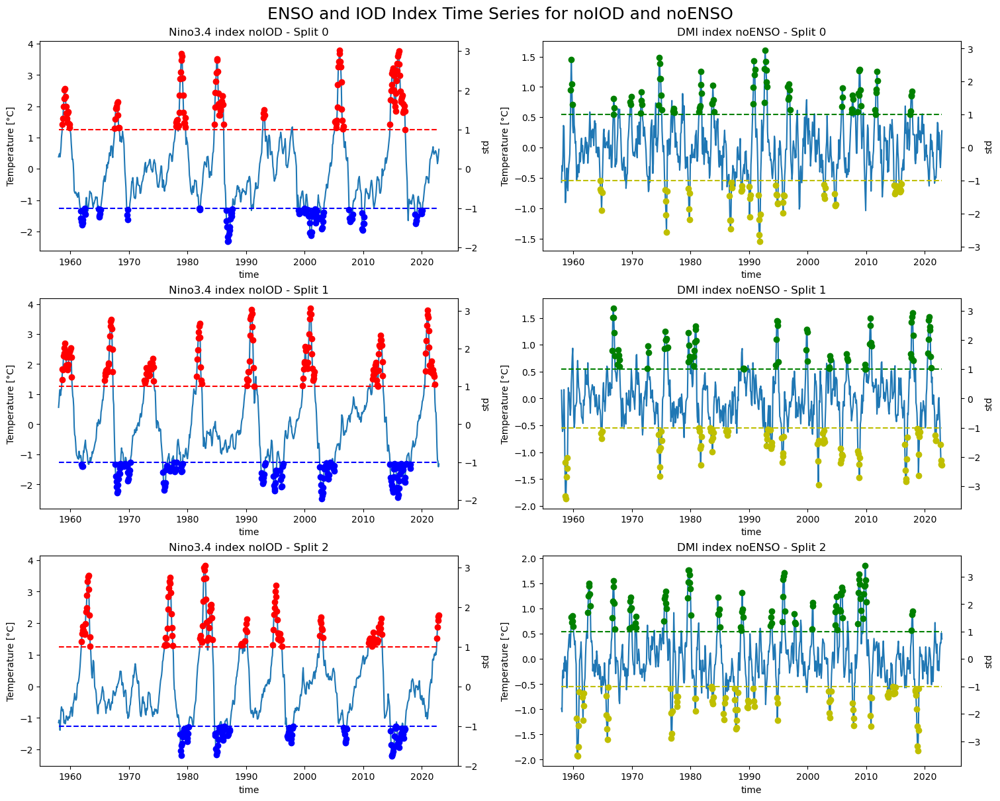

In [31]:
# difference with previous figure : this time we look at the times series of the N34 index in the noIOD experiment
# and the time series of the DMI index in the noENSO experiment

fig, axs = plt.subplots(nrows=3 , ncols=2 , figsize=(15,12), constrained_layout = True) 

# store index years : row 0 is observations, subsequent are the three splits
iNino_noIOD = []  
iNina_noIOD = [] 
iPosIOD_noENSO = [] 
iNegIOD_noENSO = []

# append None to fill in 0 index that corresponds to observation for the other index lists
iNino_noIOD.append(None) 
iNina_noIOD.append(None)
iPosIOD_noENSO.append(None) 
iNegIOD_noENSO.append(None) 

# model experiments 

N34std_noIOD = N34(anomd(ts['noIOD'])[0]).std().values*1#.5 # have the same std value across all three splits
DMIstd_noENSO = DMI(anomd(ts['noENSO'])[0]).std().values*1 

axs = axs.flatten('F')

for i in range(3):
    ax=axs[i]
    o,a = plot_climate_index(ax, ts_split['noIOD'][i],N34,N34std_noIOD,cp='r',cn='b')
    iNino_noIOD.append(o)
    iNina_noIOD.append(a)
    ax.set_title(f"Nino3.4 index noIOD - Split {i}")

    ax = axs[i+3]
    p,n = plot_climate_index(ax, ts_split['noENSO'][i],DMI,DMIstd_noENSO,cp='g',cn='y')
    iPosIOD_noENSO.append(p)
    iNegIOD_noENSO.append(n)
    ax.set_title(f"DMI index noENSO - Split {i}")

_ = fig.suptitle('ENSO and IOD Index Time Series for noIOD and noENSO', size = 18)  # change title

Do extreme values in seasonal cycle correspond to extreme event years ?

In [32]:
# Getting the values and indices of the maximum precipitation months.
max_pr, min_pr, = [], []
reg = 'Ethiopia'
tsp = PIEA(tp.where(mask_ethio_O),reg)# PIEA(pr_split['CTRL'][0].where(mask_ethio_E),reg)
piea_ts = anomd(tsp)[0]
piea_month = piea_ts.groupby('time.month')
piea_clm = piea_month.mean('time')
for n in range(12):
    pn = piea_month[n+1]
    max_pr.append((pn.max().values,(pn.argmax().values)*12+n))
    min_pr.append((pn.min().values,(pn.argmin().values)*12+n))

In [33]:
# indices of max (resp min) months ie [index of max jan, index of max feb, ..., index of max december]
# ie correpond to index of peak values in seasonal cycle
maxi = [int(a) for a in np.array(max_pr).T[1]] 
mini = [int(a) for a in np.array(min_pr).T[1]]

In [34]:
np.array(max_pr).T

array([[ 74.04382337,  73.41231257, 120.82343881,  73.86615496,
         79.0287936 ,  50.91312836,  39.01926562,  37.24259645,
         38.52186753,  96.3909112 ,  76.19849168,  34.67386579],
       [252.        , 385.        , 278.        , 699.        ,
        112.        , 341.        , 762.        , 211.        ,
        212.        , 237.        ,  70.        ,  71.        ]])

In [35]:
np.array(min_pr).T

array([[-20.47728408, -24.4595541 , -47.69515189, -78.98805715,
        -75.20754573, -50.99424867, -94.7081493 , -39.73833716,
        -26.80393278, -46.33326186, -37.54645181, -18.06107191],
       [ 36.        ,  49.        , 182.        , 135.        ,
         88.        , 101.        , 102.        , 103.        ,
        476.        , 549.        , 154.        , 119.        ]])

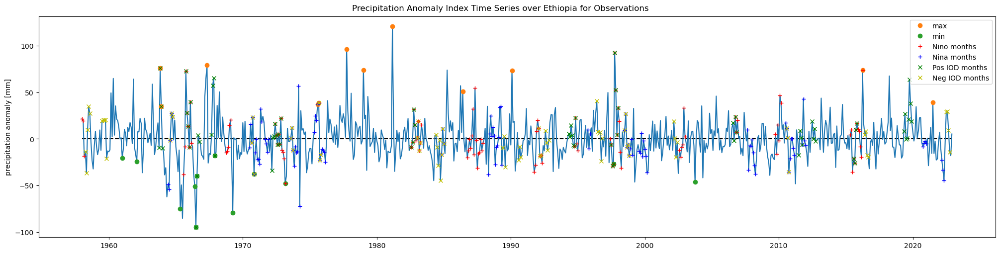

In [34]:
fig, ax = plt.subplots(nrows=1 , ncols=1 , figsize=(20,5), constrained_layout = True) 
s=0
ax.plot(dates,np.zeros(len(dates)),'k--')
ax.plot(dates,piea_ts)
ax.plot(dates[maxi],np.array(max_pr).T[0],'o',label='max')
ax.plot(dates[mini],np.array(min_pr).T[0],'o',label='min')
ax.plot(dates[iNino[s]],piea_ts[iNino[s]],'+r',label='Nino months')
ax.plot(dates[iNina[s]],piea_ts[iNina[s]],'+b',label='Nina months')
ax.plot(dates[iPosIOD[s]],piea_ts[iPosIOD[s]],'xg',label='Pos IOD months')
ax.plot(dates[iNegIOD[s]],piea_ts[iNegIOD[s]],'xy',label='Neg IOD months')

ax.legend()
ax.set_ylabel('precipitation anomaly [mm]')
_=fig.suptitle('Precipitation Anomaly Index Time Series over Ethiopia for Observations')
#observation precipitation anomaly  

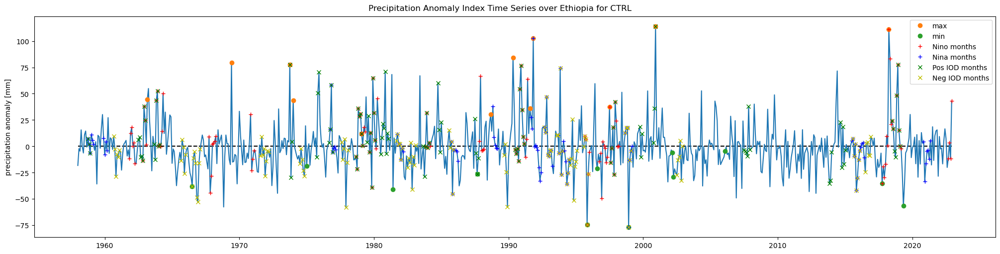

In [36]:
# Getting the values and indices of the maximum precipitation months.
max_pr, min_pr, = [], []
reg = 'Ethiopia'
exp = 'CTRL'
tsp = PIEA(pr_split[exp][0].where(mask_ethio_E),reg)
piea_ts = anomd(tsp)[0]
piea_month = piea_ts.groupby('time.month')
piea_clm = piea_month.mean('time')
for n in range(12):
    pn = piea_month[n+1]
    max_pr.append((pn.max().values,(pn.argmax().values)*12+n))
    min_pr.append((pn.min().values,(pn.argmin().values)*12+n))


# indices of max (resp min) months ie [index of max jan, index of max feb, ..., index of max december]
# ie correpond to index of peak values in seasonal cycle
maxi = [int(a) for a in np.array(max_pr).T[1]] 
mini = [int(a) for a in np.array(min_pr).T[1]]

fig, ax = plt.subplots(nrows=1 , ncols=1 , figsize=(20,5), constrained_layout = True) 
s=1
ax.plot(dates,np.zeros(len(dates)),'k--')
ax.plot(dates,piea_ts)
ax.plot(dates[maxi],np.array(max_pr).T[0],'o',label='max')
ax.plot(dates[mini],np.array(min_pr).T[0],'o',label='min')
ax.plot(dates[iNino[s]],piea_ts[iNino[s]],'+r',label='Nino months')
ax.plot(dates[iNina[s]],piea_ts[iNina[s]],'+b',label='Nina months')
ax.plot(dates[iPosIOD[s]],piea_ts[iPosIOD[s]],'xg',label='Pos IOD months')
ax.plot(dates[iNegIOD[s]],piea_ts[iNegIOD[s]],'xy',label='Neg IOD months')

ax.legend()
ax.set_ylabel('precipitation anomaly [mm]')
_=fig.suptitle(f'Precipitation Anomaly Index Time Series over Ethiopia for {exp}')
#observation precipitation anomaly  month

#### Observation Extreme Values Table

In [42]:
#observation

table_obs = [[],[],[],[],[],[],[],[],[],[],[]]
table_obs[0][:] = months

max_pr, min_pr, = [], []
reg = 'Ethiopia'
tsp = PIEA(tp.where(mask_ethio_O),reg)
piea_ts = anomd(tsp)[0]
piea_month = piea_ts.groupby('time.month')
piea_clm = piea_month.mean('time')
for n in range(12):
    pn = piea_month[n+1]
    max_pr.append((pn.max().values,(pn.argmax().values)*12+n))
    min_pr.append((pn.min().values,(pn.argmin().values)*12+n))
        
maxi = [int(a) for a in np.array(max_pr).T[1]] 
mini = [int(a) for a in np.array(min_pr).T[1]]

# max values
table_obs[1][:] = np.array(max_pr).T[0]
NinoB, NinaB, PosIB, NegIB = [], [], [], []
for i in maxi:
    NinoB.append(i in iNino[0])
    NinaB.append(i in iNina[0])
    PosIB.append(i in iPosIOD[0])
    NegIB.append(i in iNegIOD[0])

table_obs[2][:]=NinoB
table_obs[3][:]=NinaB
table_obs[4][:]=PosIB
table_obs[5][:]=NegIB

# min values
table_obs[6][:] = np.array(min_pr).T[0]

NinoB, NinaB, PosIB, NegIB = [], [], [], []
for i in mini:
    NinoB.append(i in iNino[0])
    NinaB.append(i in iNina[0])
    PosIB.append(i in iPosIOD[0])
    NegIB.append(i in iNegIOD[0])

table_obs[7][:]=NinoB
table_obs[8][:]=NinaB
table_obs[9][:]=PosIB
table_obs[10][:]=NegIB


# Legends
columns = ['Months', 'Max Value', 'Nino', 'Nina', 'PosIOD', 'NegIOD', 'Min Value', 'Nino', 'Nina', 'PosIOD', 'NegIOD']

# Transpose data and add bold formatting
data = list(zip(*table_obs))
columns_bold = [f"**{col}**" for col in columns]
data_bold = [[f"**{row[0]}**"] + list(row[1:]) for row in data]

# Pretty print using tabulate#
#print(tabulate(data_bold, headers=columns_bold, tablefmt="github"))

# Create DataFrame
#df = pd.DataFrame(table_obs).transpose()
#df.columns = columns

# Display table
#print(df.to_string(index=False))

**Observation**

| **Months**    |   **Max Value** | **Nino**   | **Nina**   | **PosIOD**   | **NegIOD**   |   **Min Value** | **Nino**   | **Nina**   | **PosIOD**   | **NegIOD**   |
|---------------|-----------------|------------|------------|--------------|--------------|-----------------|------------|------------|--------------|--------------|
| **January**   |         74.0438 | False      | False      | False        | False        |        -20.4773 | False      | False      | False        | False        |
| **February**  |         73.4123 | False      | False      | False        | False        |        -24.4596 | False      | False      | False        | False        |
| **March**     |        120.823  | False      | False      | False        | False        |        -47.6952 | True       | False      | False        | False        |
| **April**     |         73.8662 | True       | False      | False        | False        |        -78.9881 | False      | False      | False        | False        |
| **May**       |         79.0288 | False      | False      | False        | False        |        -75.2075 | False      | False      | False        | False        |
| **June**      |         50.9131 | False      | False      | False        | False        |        -50.9942 | False      | False      | False        | False        |
| **July**      |         39.0193 | False      | False      | False        | False        |        -94.7081 | False      | False      | True         | False        |
| **August**    |         37.2426 | False      | True       | False        | False        |        -39.7383 | False      | False      | True         | False        |
| **September** |         38.5219 | False      | True       | False        | True         |        -26.8039 | True       | False      | True         | False        |
| **October**   |         96.3909 | False      | False      | False        | False        |        -46.3333 | False      | False      | False        | False        |
| **November**  |         76.1985 | False      | False      | True         | False        |        -37.5465 | False      | True       | False        | True         |
| **December**  |         34.6739 | False      | False      | True         | False        |        -18.0611 | False      | False      | True         | False        |

#### CTRL Extreme Values Table

In [43]:
exp = 'CTRL'
reg = 'Ethiopia'

table_ctrl = [[],[],[],[],[],[],[],[],[],[],[]]
table_ctrl[0][:] = months + months + months

for s in range(3):
    max_pr, min_pr, = [], []
    tsp = PIEA(pr_split[exp][s].where(mask_ethio_E),reg)
    piea_ts = anomd(tsp)[0]
    piea_month = piea_ts.groupby('time.month')
    piea_clm = piea_month.mean('time')
    for n in range(12):
        pn = piea_month[n+1]
        max_pr.append((pn.max().values,(pn.argmax().values)*12+n))
        min_pr.append((pn.min().values,(pn.argmin().values)*12+n))
            
    maxi = [int(a) for a in np.array(max_pr).T[1]] 
    mini = [int(a) for a in np.array(min_pr).T[1]]
    
    # max values
    table_ctrl[1] = np.concatenate([table_ctrl[1],np.array(max_pr).T[0]])
    for i in maxi:    
        table_ctrl[2].append(i in iNino[s+1])
        table_ctrl[3].append(i in iNina[s+1])
        table_ctrl[4].append(i in iPosIOD[s+1])
        table_ctrl[5].append(i in iNegIOD[s+1])
    
    # min values
    table_ctrl[6] = np.concatenate([table_ctrl[6],np.array(min_pr).T[0]])
    
    for i in mini:
        table_ctrl[7].append(i in iNino[s+1])
        table_ctrl[8].append(i in iNina[s+1])
        table_ctrl[9].append(i in iPosIOD[s+1])
        table_ctrl[10].append(i in iNegIOD[s+1])

# Legends
columns = ['Months', 'Max Value', 'Nino', 'Nina', 'PosIOD', 'NegIOD', 'Min Value', 'Nino', 'Nina', 'PosIOD', 'NegIOD']

# Transpose data and add bold formatting
data = list(zip(*table_ctrl))
columns_bold = [f"**{col}**" for col in columns]
data_bold = [[f"**{row[0]}**"] + list(row[1:]) for row in data]

# Pretty print using tabulate#
#print(tabulate(data_bold, headers=columns_bold, tablefmt="github"))

# Create DataFrame
#df = pd.DataFrame(table_ctrl).transpose()
#df.columns = columns

# Display table
#print(df.to_string(index=False))

**CTRL**

| **Months**    |   **Max Value** | **Nino**   | **Nina**   | **PosIOD**   | **NegIOD**   |   **Min Value** | **Nino**   | **Nina**   | **PosIOD**   | **NegIOD**   |
|---------------|-----------------|------------|------------|--------------|--------------|-----------------|------------|------------|--------------|--------------|
| **January**   |         43.8144 | False      | False      | False        | False        |       -18.6505  | False      | False      | False        | False        |
| **February**  |         11.7762 | True       | False      | True         | False        |        -4.65494 | False      | False      | False        | False        |
| **March**     |         44.5504 | False      | False      | False        | False        |        -5.84603 | False      | False      | False        | False        |
| **April**     |        111.143  | True       | False      | False        | False        |       -28.8712  | False      | False      | False        | False        |
| **May**       |         84.1164 | False      | False      | False        | False        |       -56.6305  | False      | False      | False        | False        |
| **June**      |         79.4429 | False      | False      | False        | False        |       -40.9985  | False      | False      | False        | False        |
| **July**      |         37.5733 | True       | False      | False        | False        |       -37.838   | False      | False      | False        | True         |
| **August**    |         35.8916 | False      | False      | False        | False        |       -21.2556  | False      | False      | False        | False        |
| **September** |         30.1984 | False      | False      | False        | False        |       -26.1047  | False      | False      | True         | False        |
| **October**   |         77.7303 | False      | False      | True         | False        |       -35.0307  | True       | False      | False        | False        |
| **November**  |        102.424  | False      | True       | False        | False        |       -74.2768  | True       | False      | False        | True         |
| **December**  |        114.025  | False      | False      | True         | False        |       -76.798   | False      | True       | False        | True         |
| **January**   |         84.838  | True       | False      | True         | False        |       -20.2754  | False      | False      | False        | False        |
| **February**  |         23.7676 | True       | False      | True         | False        |        -8.65306 | False      | False      | False        | False        |
| **March**     |         27.1908 | False      | False      | True         | False        |        -9.78636 | False      | False      | False        | False        |
| **April**     |         65.3352 | True       | False      | False        | False        |       -26.6423  | False      | False      | False        | False        |
| **May**       |         62.2332 | False      | False      | False        | False        |       -38.8832  | False      | False      | False        | False        |
| **June**      |         83.7863 | False      | False      | False        | False        |       -57.935   | False      | True       | False        | True         |
| **July**      |         49.7283 | True       | False      | True         | False        |       -31.0458  | False      | False      | False        | False        |
| **August**    |         63.7238 | False      | False      | True         | False        |       -26.8884  | False      | False      | True         | False        |
| **September** |         40.196  | False      | False      | False        | False        |       -24.0417  | True       | False      | False        | False        |
| **October**   |         51.6825 | False      | True       | False        | False        |       -43.6165  | True       | False      | False        | False        |
| **November**  |         81.5646 | False      | False      | True         | False        |       -75.2142  | True       | False      | False        | False        |
| **December**  |        101.32   | True       | False      | True         | False        |       -57.9039  | False      | True       | False        | True         |
| **January**   |         46.8767 | True       | False      | True         | False        |       -22.0374  | False      | True       | False        | True         |
| **February**  |         22.4156 | True       | False      | True         | False        |        -7.83592 | False      | True       | False        | True         |
| **March**     |         45.2902 | True       | False      | True         | False        |        -8.44216 | False      | False      | False        | False        |
| **April**     |         80.5916 | True       | False      | False        | False        |       -31.8666  | False      | False      | False        | False        |
| **May**       |         95.476  | False      | False      | False        | False        |       -40.646   | False      | False      | False        | False        |
| **June**      |         80.2885 | False      | False      | False        | False        |       -68.4731  | False      | False      | False        | False        |
| **July**      |         57.6061 | True       | False      | True         | False        |       -31.6976  | False      | False      | False        | False        |
| **August**    |         41.4987 | False      | False      | True         | False        |       -23.5646  | False      | False      | False        | False        |
| **September** |         60.8774 | False      | False      | True         | False        |       -23.4977  | False      | False      | False        | False        |
| **October**   |         62.2103 | False      | False      | False        | False        |       -44.3784  | False      | False      | False        | False        |
| **November**  |         95.5391 | False      | False      | True         | False        |       -70.5229  | False      | False      | False        | False        |
| **December**  |        148.549  | True       | False      | True         | False        |       -72.8393  | False      | True       | False        | True         |

#### noIOD Extreme Values Table

In [44]:
exp = 'noIOD'

table_noiod = [[],[],[],[],[],[],[]]
table_noiod[0][:] = months + months + months

reg = 'Ethiopia'
for s in range(3):
    max_pr, min_pr, = [], []
    tsp = PIEA(pr_split[exp][s].where(mask_ethio_E),reg)
    piea_ts = anomd(tsp)[0]
    piea_month = piea_ts.groupby('time.month')
    piea_clm = piea_month.mean('time')
    for n in range(12):
        pn = piea_month[n+1]
        max_pr.append((pn.max().values,(pn.argmax().values)*12+n))
        min_pr.append((pn.min().values,(pn.argmin().values)*12+n))
        
    maxi = [int(a) for a in np.array(max_pr).T[1]] 
    mini = [int(a) for a in np.array(min_pr).T[1]]#

    # max values
    table_noiod[1] = np.concatenate([table_noiod[1],np.array(max_pr).T[0]])
    for i in maxi:    
        table_noiod[2].append(i in iNino_noIOD[s+1])
        table_noiod[3].append(i in iNina_noIOD[s+1])
    
    # min values
    table_noiod[4] = np.concatenate([table_noiod[4],np.array(min_pr).T[0]])
    for i in mini:    
        table_noiod[5].append(i in iNino_noIOD[s+1])
        table_noiod[6].append(i in iNina_noIOD[s+1])

# Legends
columns = ['Months', 'Max Value', 'Nino', 'Nina', 'Min Value', 'Nino', 'Nina']

# Transpose data and add bold formatting
data = list(zip(*table_noiod))
columns_bold = [f"**{col}**" for col in columns]
data_bold = [[f"**{row[0]}**"] + list(row[1:]) for row in data]

# Pretty print using tabulate
#print(tabulate(data_bold, headers=columns_bold, tablefmt="github"))

# Create DataFrame
#df = pd.DataFrame(table_ctrl).transpose()
#df.columns = columns

# Display table
#print(df.to_string(index=False))

**noIOD**

| **Months**    |   **Max Value** | **Nino**   | **Nina**   |   **Min Value** | **Nino**   | **Nina**   |
|---------------|-----------------|------------|------------|-----------------|------------|------------|
| **January**   |         51.041  | True       | False      |       -20.3575  | False      | False      |
| **February**  |         46.5875 | True       | False      |        -9.18885 | False      | False      |
| **March**     |         67.3668 | True       | False      |       -12.4637  | False      | False      |
| **April**     |         98.3255 | True       | False      |       -41.3192  | False      | False      |
| **May**       |         98.4958 | True       | False      |       -54.7418  | False      | False      |
| **June**      |         75.6572 | False      | False      |       -42.56    | False      | False      |
| **July**      |         53.5939 | False      | True       |       -32.0317  | False      | False      |
| **August**    |         32.4778 | False      | True       |       -27.2951  | False      | False      |
| **September** |         41.5199 | False      | False      |       -24.7611  | False      | False      |
| **October**   |         69.6386 | False      | False      |       -49.4838  | True       | False      |
| **November**  |         78.055  | False      | True       |       -44.2207  | True       | False      |
| **December**  |         52.9079 | False      | False      |       -37.6963  | False      | True       |
| **January**   |         36.193  | True       | False      |       -17.5518  | True       | False      |
| **February**  |         83.8056 | True       | False      |        -8.58516 | False      | False      |
| **March**     |         79.0935 | True       | False      |       -12.4911  | False      | False      |
| **April**     |        116.979  | True       | False      |       -42.9589  | False      | False      |
| **May**       |        102.314  | True       | False      |       -55.0415  | False      | True       |
| **June**      |         82.4889 | True       | False      |       -41.9612  | False      | False      |
| **July**      |         50.8403 | False      | False      |       -41.7912  | True       | False      |
| **August**    |         54.7288 | False      | True       |       -32.1393  | False      | False      |
| **September** |         29.5762 | False      | False      |       -26.5729  | False      | False      |
| **October**   |         61.6244 | False      | True       |       -52.1375  | True       | False      |
| **November**  |         94.3041 | False      | False      |       -59.5852  | False      | False      |
| **December**  |         81.1145 | True       | False      |       -69.1865  | False      | False      |
| **January**   |         49.2043 | True       | False      |       -20.4961  | False      | False      |
| **February**  |         40.7448 | True       | False      |        -8.83141 | False      | False      |
| **March**     |         82.4103 | True       | False      |       -13.98    | False      | False      |
| **April**     |        124.41   | True       | False      |       -38.5872  | False      | True       |
| **May**       |        114.897  | True       | False      |       -48.9298  | False      | False      |
| **June**      |         64.5407 | False      | False      |       -50.8402  | False      | True       |
| **July**      |         41.5152 | False      | False      |       -24.0357  | False      | False      |
| **August**    |         41.2382 | False      | False      |       -25.2784  | False      | False      |
| **September** |         35.2684 | False      | True       |       -31.4117  | False      | False      |
| **October**   |         69.1513 | False      | False      |       -45.2748  | False      | False      |
| **November**  |         73.2619 | False      | True       |       -45.8631  | False      | False      |
| **December**  |         85.6616 | False      | False      |       -47.6907  | False      | False      |

Maximum precipitation values during the following months coincide with el Nino events :
december(1), january(3), february(3), march(3), april(3), may(3), june(1).

Looking at the maximum values during la Nina months, we observe that maximum values happen during the months that follow the above (though it should be checked that the months actually follow each other in a same year):
july(1), august(2), september(1), october(1), november(2).

Minimum precipitation values during el Nino months are oberserved in july(1), october(2), november(2), january(1). For la Nino events, the minimum value months are april(1), may(1), june(1), december(1).

#### noENSO Extreme Values Table

In [45]:
exp = 'noENSO'

table_noenso = [[],[],[],[],[],[],[]]
table_noenso[0][:] = months + months + months

reg = 'Ethiopia'
for s in range(3):
    max_pr, min_pr, = [], []
    tsp = PIEA(pr_split[exp][s].where(mask_ethio_E),reg)
    piea_ts = anomd(tsp)[0]
    piea_month = piea_ts.groupby('time.month')
    piea_clm = piea_month.mean('time')
    for n in range(12):
        pn = piea_month[n+1]
        max_pr.append((pn.max().values,(pn.argmax().values)*12+n))
        min_pr.append((pn.min().values,(pn.argmin().values)*12+n))
        
    maxi = [int(a) for a in np.array(max_pr).T[1]] 
    mini = [int(a) for a in np.array(min_pr).T[1]]#

    # max values
    table_noenso[1] = np.concatenate([table_noenso[1],np.array(max_pr).T[0]])
    for i in maxi:    
        table_noenso[2].append(i in iPosIOD_noENSO[s+1])
        table_noenso[3].append(i in iNegIOD_noENSO[s+1])
    
    # min values
    table_noenso[4] = np.concatenate([table_noenso[4],np.array(min_pr).T[0]])
    for i in mini:    
        table_noenso[5].append(i in iPosIOD_noENSO[s+1])
        table_noenso[6].append(i in iNegIOD_noENSO[s+1])

# Legends
columns = ['Months', 'Max Value', 'PosIOD', 'NegIOD', 'Min Value', 'PosIOD', 'NegIOD']

# Transpose data and add bold formatting
data = list(zip(*table_noenso))
columns_bold = [f"**{col}**" for col in columns]
data_bold = [[f"**{row[0]}**"] + list(row[1:]) for row in data]

# Pretty print using tabulate
#print(tabulate(data_bold, headers=columns_bold, tablefmt="github"))

# Create DataFrame
#df = pd.DataFrame(table_ctrl).transpose()
#df.columns = columns

# Display table
#print(df.to_string(index=False))

**noENSO**

| **Months**    |   **Max Value** | **PosIOD**   | **NegIOD**   |   **Min Value** | **PosIOD**   | **NegIOD**   |
|---------------|-----------------|--------------|--------------|-----------------|--------------|--------------|
| **January**   |        40.9558  | False        | False        |       -19.1817  | False        | True         |
| **February**  |        12.6969  | True         | False        |        -3.09481 | False        | False        |
| **March**     |        50.3339  | False        | False        |        -6.02034 | False        | False        |
| **April**     |        71.2146  | False        | False        |       -26.5578  | False        | False        |
| **May**       |        45.7328  | False        | False        |       -40.0494  | False        | False        |
| **June**      |        73.2875  | False        | False        |       -52.9443  | False        | False        |
| **July**      |        36.6934  | False        | False        |       -24.5712  | False        | False        |
| **August**    |        67.4414  | False        | False        |       -30.808   | False        | True         |
| **September** |        46.6513  | True         | False        |       -34.4604  | False        | True         |
| **October**   |        71.663   | True         | False        |       -28.9563  | False        | False        |
| **November**  |       112.582   | True         | False        |       -43.9093  | False        | False        |
| **December**  |       103.827   | False        | False        |       -48.7746  | False        | True         |
| **January**   |        49.1859  | False        | False        |       -18.1155  | False        | True         |
| **February**  |        14.1246  | False        | False        |        -5.55473 | False        | False        |
| **March**     |        21.283   | False        | False        |        -5.45496 | False        | False        |
| **April**     |        53.5026  | False        | False        |       -30.53    | False        | False        |
| **May**       |       125.215   | False        | False        |       -40.815   | False        | False        |
| **June**      |        73.6911  | False        | False        |       -47.3168  | False        | False        |
| **July**      |        43.4048  | False        | False        |       -24.4608  | False        | False        |
| **August**    |        40.1154  | False        | False        |       -25.8019  | False        | False        |
| **September** |        38.6883  | True         | False        |       -19.0313  | False        | False        |
| **October**   |        51.7409  | True         | False        |       -33.4649  | False        | False        |
| **November**  |        90.2136  | True         | False        |       -49.8694  | False        | False        |
| **December**  |        79.5225  | True         | False        |       -66.1842  | False        | True         |
| **January**   |        36.2004  | True         | False        |       -18.1999  | False        | False        |
| **February**  |         9.96128 | False        | False        |        -4.1396  | False        | False        |
| **March**     |        19.9034  | False        | False        |        -4.86674 | False        | False        |
| **April**     |        60.7003  | False        | False        |       -24.0439  | False        | False        |
| **May**       |       120.588   | False        | False        |       -46.5261  | False        | False        |
| **June**      |        78.1261  | False        | False        |       -45.2885  | False        | False        |
| **July**      |        50.0926  | True         | False        |       -30.2255  | False        | False        |
| **August**    |        35.4232  | True         | False        |       -26.7176  | False        | False        |
| **September** |        42.7471  | True         | False        |       -21.4946  | False        | False        |
| **October**   |        39.0907  | True         | False        |       -31.4711  | False        | False        |
| **November**  |        78.2213  | False        | False        |       -65.834   | False        | False        |
| **December**  |       142.186   | True         | False        |       -47.3259  | False        | False        |

Maximum values never happened during negative IOD episodes, and minimum values never happened during positive IOD episodes. However, maximum values for September and October consistently happened during positive IOD events, sometimes also happening in November(2), December(2), January(1), February(1), July(1) and August(1). Minimum values during positive IOD events have happened in the following months : December(2), January(2), August(1), September(1). 

#### Composite Figures

To make the following figures, for each split I compute precipitation fields averaged over el nino or la nina events and check significance at $95\%$ confidence. The figures that we see is the result after averaging over the three splits. $n$ is the total number of samples over the three splits so should be compared to $780 \times 3 = 2340$.

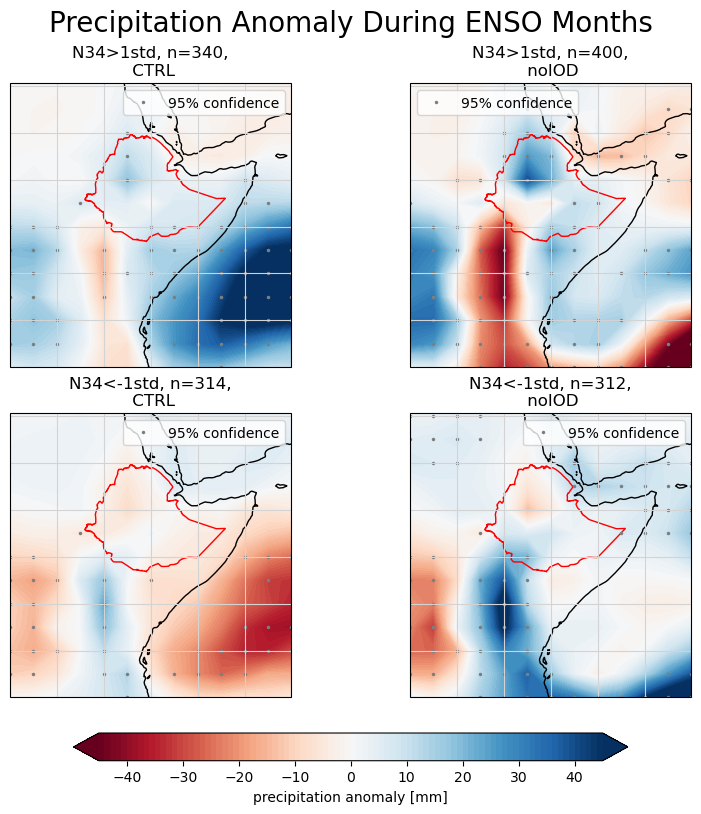

In [46]:
fig, axs = plt.subplots(ncols=2,nrows=2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(8,8), constrained_layout = True) 

axs = axs.flatten('F')
levs = np.arange(-45,46,1)
cmap = 'RdBu'

iENSO = [iNino,  iNina, iNino_noIOD, iNina_noIOD]
txt = ['N34>1std', 'N34<-1std', 'N34>1std', 'N34<-1std']
tmp_exp = ['CTRL','CTRL','noIOD','noIOD']
#tmp_exp = ['amipFULL','amipFULL','amipIOclm','amipIOclm']

for j,idxs in enumerate(iENSO):
    exp = tmp_exp[j]
    flda = xr.DataArray(0)
    zs = xr.DataArray(0)
    n = 0
    for s in range(3):
        da = anomd(pr_split[exp][s])[0]
        idx = idxs[s+1]
        n += len(idx)
        zs = zs + z_test(da,idx,conf=0.95)
        flda = flda + da.isel(time=idx).mean('time')
    ax = axs[j]
    cs = map_ea(flda/3,ax,levs,cmap,draw_labels=False)
    stipple(ax,zs/3)
    ax.set_title(f'{txt[j]}, n={n},\n {exp}')
    ax.legend()

fig.colorbar(cs, ax = axs ,orientation = 'horizontal',shrink = 0.7,label='precipitation anomaly [mm]')
_=fig.suptitle('Precipitation Anomaly During ENSO Months', fontsize=20)

Looking at ENSO months for the control gives us insight into how ENSO influences the precipitation pattern, further looking at the noIOD experiment allows to isolate IOD out of the control and really just look at ENSO events.

These figures are consistent with the correlation plots. During el Nino events, the north west and south east of Ethiopia can expect more rain. During la Nina events, not so much can be said about Ethiopia itself.

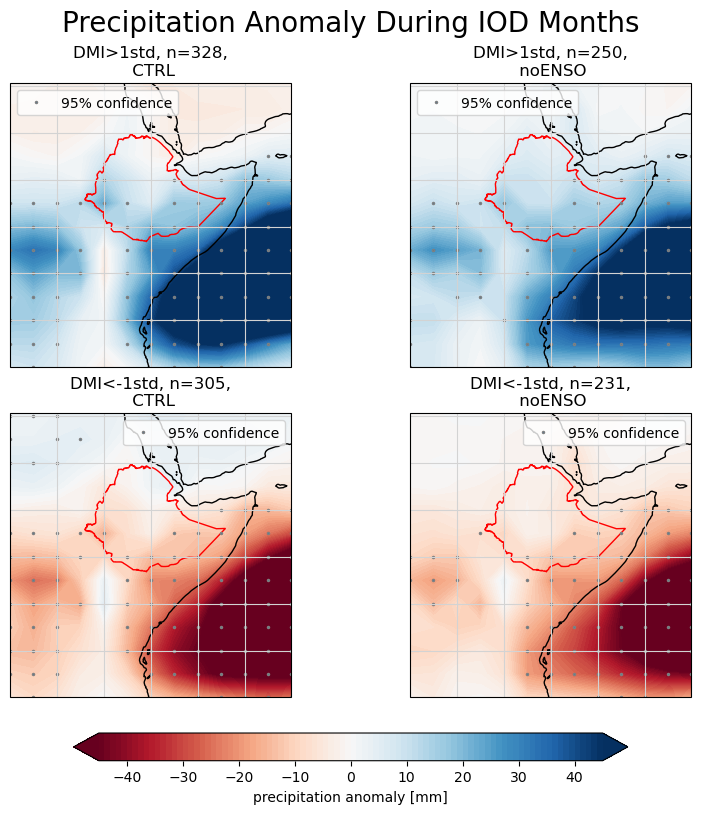

In [47]:
fig, axs = plt.subplots(ncols=2,nrows=2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(8,8), constrained_layout = True) 

axs = axs.flatten('F')
levs = np.arange(-45,46,1)
cmap = 'RdBu'


iIOD = [iPosIOD, iNegIOD, iPosIOD_noENSO, iNegIOD_noENSO]
txt = ['DMI>1std', 'DMI<-1std', 'DMI>1std', 'DMI<-1std']
tmp_exp = ['CTRL','CTRL','noENSO','noENSO']
#tmp_exp = ['amipFULL','amipFULL','amipPACclm','amipPACclm']

for j,idxs in enumerate(iIOD):
    exp = tmp_exp[j]
    flda = xr.DataArray(0)
    zs = xr.DataArray(0)
    n = 0
    for s in range(3):
        da = anomd(pr_split[exp][s])[0]
        idx = idxs[s+1]
        n += len(idx)
        zs = zs + z_test(da,idx,conf=0.95)
        flda = flda + da.isel(time=idx).mean('time')
    ax = axs[j]
    cs = map_ea(flda/3,ax,levs,cmap,draw_labels=False)
    stipple(ax,zs/3)
    ax.set_title(f'{txt[j]}, n={n},\n {exp}')
    ax.legend()

fig.colorbar(cs, ax = axs ,orientation = 'horizontal',shrink = 0.7,label='precipitation anomaly [mm]')
_=fig.suptitle('Precipitation Anomaly During IOD Months', fontsize=20)

Positive IOD months mean south and west Ethiopia can expect more rain whereas during negative IOD months they should expect less.

##### **Long and Short Rain Seasons**

First let's get the indices of the months that correspond to long and short rain seasons intersected with ENSO or IOD months. The long rain months are chosen to be May, June, July and the short rain months are October and November as this is consistent with earlier seasonal cycle plots.

In [48]:
imonths = np.array([a*12 for a in range(65)])
mjj = (set(imonths+4)|set(imonths+5)|set(imonths+6)) #mjj
on = (set(imonths+9)|set(imonths+10)) #on
        
def rainy_season_event(iIndex,season,lag=3):
    long_PosIOD = []
    for s in range(1,4):
        tmp = []
        for i in range(lag):
            tmp = tmp + list(set(np.array(iIndex[s])-i)&season)
        long_PosIOD.append(sorted(set(tmp)))
    return long_PosIOD

def rainy_season_noevent(iPos,iNeg,season):
    tmp = []
    for s in range(3):
        tmp.append(list(season.difference(iPos[s],iNeg[s])))
    return tmp

long_PosIOD = rainy_season_event(iPosIOD_noENSO,mjj)
short_PosIOD = rainy_season_event(iPosIOD_noENSO,on)
long_NegIOD = rainy_season_event(iNegIOD_noENSO,mjj)
short_NegIOD = rainy_season_event(iNegIOD_noENSO,on)
long_noIOD = rainy_season_noevent(long_PosIOD,long_NegIOD,mjj)
short_noIOD = rainy_season_noevent(short_PosIOD,short_NegIOD,on)

long_Nino = rainy_season_event(iNino_noIOD,mjj)
short_Nino = rainy_season_event(iNino_noIOD,on)
long_Nina = rainy_season_event(iNina_noIOD,mjj)
short_Nina = rainy_season_event(iNina_noIOD,on)
long_noENSO = rainy_season_noevent(long_Nino,long_Nina,mjj)
short_noENSO = rainy_season_noevent(short_Nino,short_Nina,on)

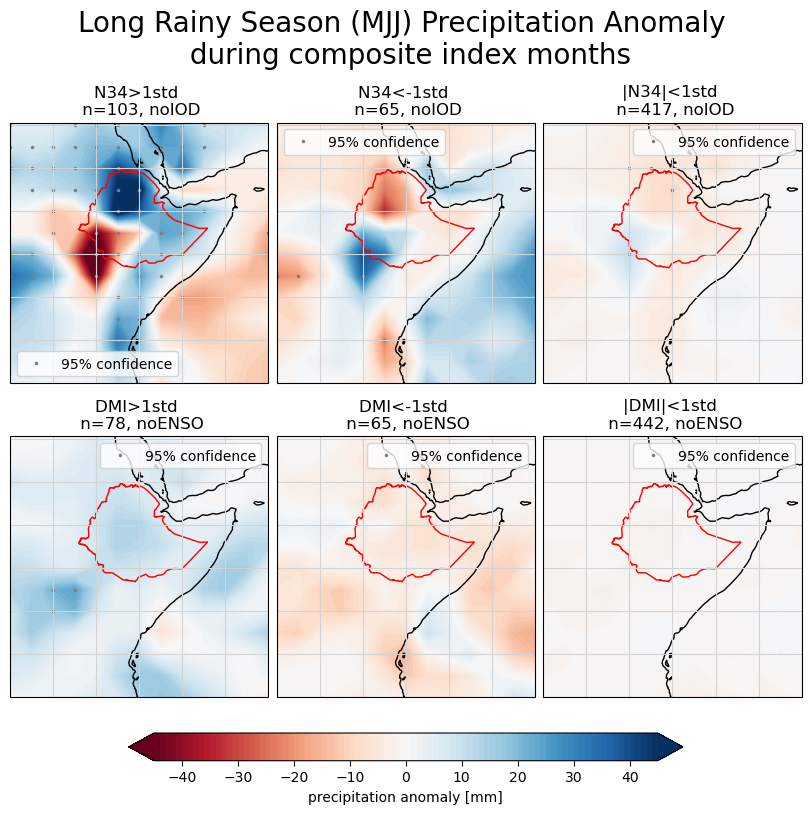

In [49]:
fig, axs = plt.subplots(ncols=3,nrows=2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(8,8), constrained_layout = True) 

axs = axs.flatten()
levs = np.arange(-45,46,1)
cmap = 'RdBu'


longidx = [long_Nino,long_Nina,long_noENSO,long_PosIOD,long_NegIOD,long_noIOD]
exps = ['noIOD','noIOD','noIOD','noENSO','noENSO','noENSO']
txt = ['N34>1std', 'N34<-1std', '|N34|<1std', 'DMI>1std', 'DMI<-1std', '|DMI|<1std']
#txt = ['El Nino','La Nina','Neither','PosIOD','NegIOD','Neither']

for j, idxs in enumerate(longidx):
    flda = xr.DataArray(0)
    zs = xr.DataArray(0)
    n = 0
    exp = exps[j]
    for s in range(3):
        da = anomd(pr_split[exp][s])[0]
        idx = np.array(idxs[s])
        #new_idx = idx//12*3+(idx%12)-4
        n += len(idx)
        zs = zs + z_test(da,idx,conf=0.95)
        flda = flda + da.isel(time=idx).mean('time')
    ax = axs[j]
    cs = map_ea(flda/3,ax,levs,cmap,draw_labels=False)
    stipple(ax,zs/3)
    ax.set_title(f'{txt[j]} \n n={n}, {exp}')
    ax.legend()

fig.colorbar(cs, ax = axs ,orientation = 'horizontal',shrink = 0.7,label='precipitation anomaly [mm]')
_=fig.suptitle('Long Rainy Season (MJJ) Precipitation Anomaly \n during composite index months', fontsize=20)

The first columns are positive events, the second negative events, and the third are when there are no events but serve as a comparison since the confidence dots are taken with respect to all months. 

During el nino events and long rain season, northern and western Ethiopia get considerably more rain (around +40mm, +20mm) and south eastern Ethiopia considerably less (around -35mm).

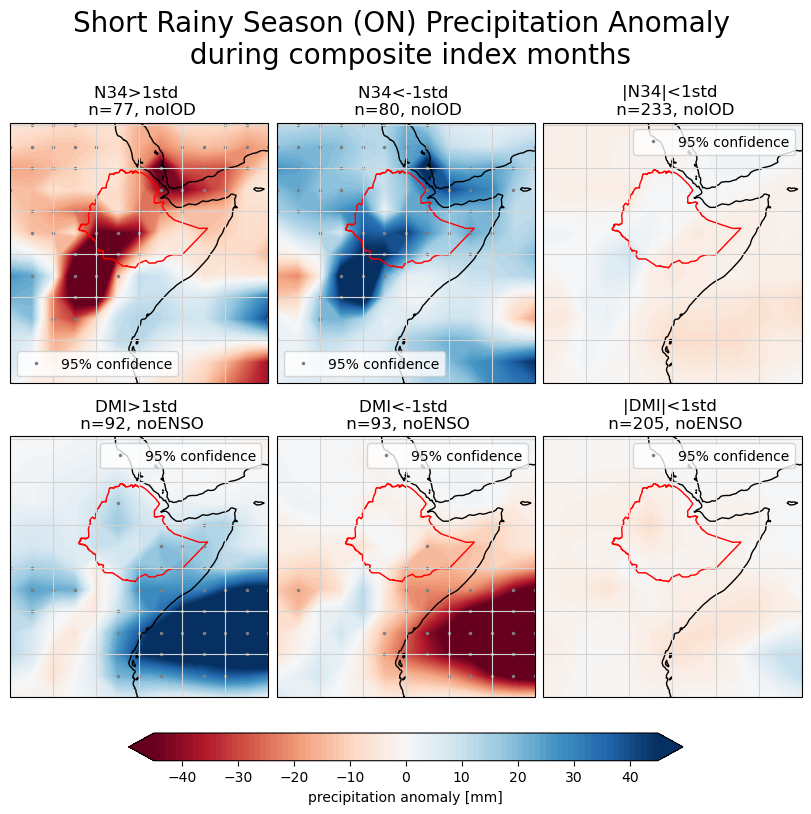

In [50]:
fig, axs = plt.subplots(ncols=3,nrows=2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(8,8), constrained_layout = True) 

axs = axs.flatten()
levs = np.arange(-45,46,1)
cmap = 'RdBu'


longidx = [short_Nino,short_Nina,short_noENSO,short_PosIOD,short_NegIOD,short_noIOD]
#exps = ['noIOD','noIOD','noIOD','noENSO','noENSO','noENSO']
#txt = ['El Nino','La Nina','Neither','PosIOD','NegIOD','Neither']

for j, idxs in enumerate(longidx):
    flda = xr.DataArray(0)
    zs = xr.DataArray(0)
    n = 0
    exp = exps[j]
    for s in range(3):
        da = anomd(pr_split[exp][s])[0]
        idx = idxs[s]
        n += len(idx)
        zs = zs + z_test(da,idx,conf=0.95)
        flda = flda + da.isel(time=idx).mean('time')
    ax = axs[j]
    cs = map_ea(flda/3,ax,levs,cmap,draw_labels=False)
    stipple(ax,zs/3)
    ax.set_title(f'{txt[j]} \n n={n}, {exp}')
    ax.legend()


fig.colorbar(cs, ax = axs ,orientation = 'horizontal',shrink = 0.7,label='precipitation anomaly [mm]')
_=fig.suptitle('Short Rainy Season (ON) Precipitation Anomaly \n during composite index months', fontsize=20)

El nino contributes to a rain deficit in south east Ethiopia during the short rain season, and la nina more rain. IOD brings more rain during positive envents in south west Ethiopia and less during during negative episodes.

### EOF 

Here is a quick eof analysis just to see what it looks like.

/tmp/ipykernel_908/3694862253.py:51: ComplexWarning: Casting complex values to real discards the imaginary part
  m1[inan]=E[:,i]
/tmp/ipykernel_908/3694862253.py:54: ComplexWarning: Casting complex values to real discards the imaginary part
  pcs[:,i]=A[:,i]/mstd
/tmp/ipykernel_908/3694862253.py:51: ComplexWarning: Casting complex values to real discards the imaginary part
  m1[inan]=E[:,i]
/tmp/ipykernel_908/3694862253.py:54: ComplexWarning: Casting complex values to real discards the imaginary part
  pcs[:,i]=A[:,i]/mstd
/tmp/ipykernel_908/3694862253.py:51: ComplexWarning: Casting complex values to real discards the imaginary part
  m1[inan]=E[:,i]
/tmp/ipykernel_908/3694862253.py:54: ComplexWarning: Casting complex values to real discards the imaginary part
  pcs[:,i]=A[:,i]/mstd


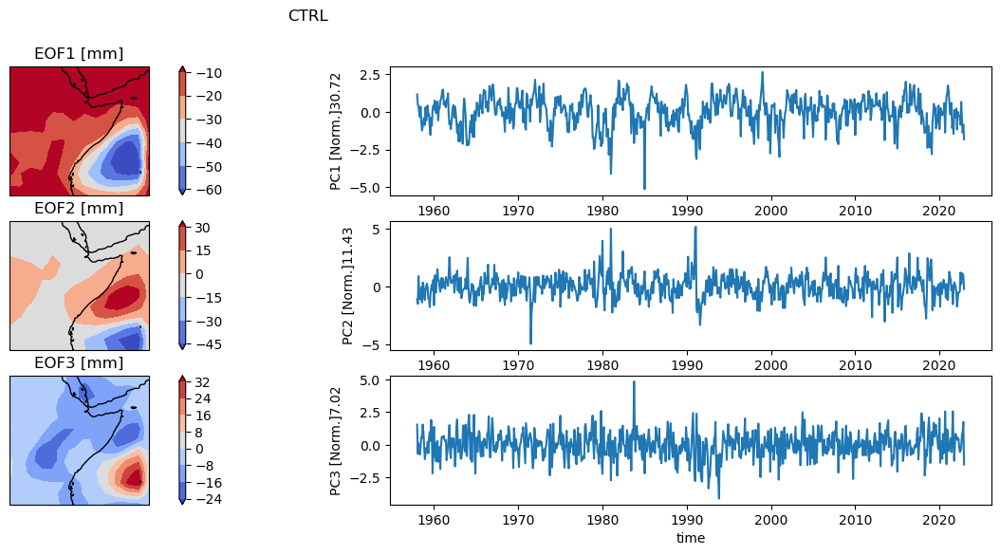

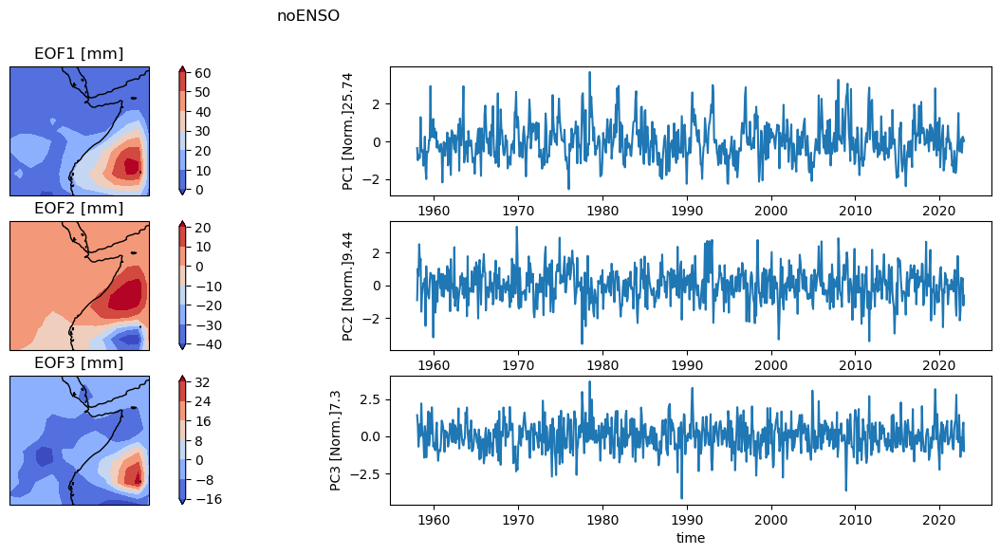

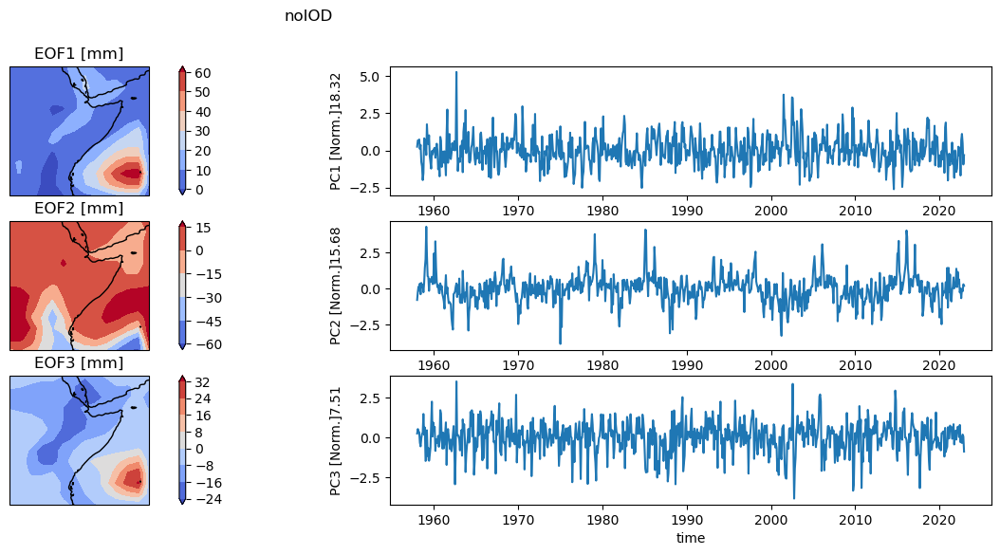

In [41]:
for exp in COUPLED:
    
    eofs, pcs, varexp = eof(anomd(pr_split[exp][0])[0], 20, -10, 25, 55)
    
    fig = plt.figure(figsize=(18,6))
    gs = fig.add_gridspec(3, 2)
    fac=[1,-1,1]
    for i in range(3):
    # Select the month 1 forecast from the specified model
        data=fac[i]*eofs[:,:,i]
        # Add the cyclic point
        data,lons=add_cyclic_point(data,coord=pr_split[exp][0]['lon'].sel(lon=slice(25,55)))
        ax1 = fig.add_subplot(gs[i, 0], projection=ccrs.PlateCarree())
        im = ax1.contourf(lons,pr_split[exp][0]['lat'].sel(lat=slice(20,-10)),data,transform = ccrs.PlateCarree(),cmap='coolwarm',extend='both')
        plt.colorbar(im,ax=ax1)
        ax1.coastlines(resolution='auto', color='k')
        ax1.set_title('EOF'+str(i+1)+' [mm]')
        #ax1.gridlines(color='lightgrey', linestyle='--', draw_labels=True)
        ax2 = fig.add_subplot(gs[i, 1])
        ax2.plot(dates,fac[i]*pcs[:,i])
        ax2.set_ylabel('PC'+str(i+1)+' [Norm.]'+str(round(varexp[i].real,2)))
        ax2.set_xlabel('time')
    fig.suptitle(f'{exp}')

The first eof represents the dominant precipiation variability pattern in East Africa with 30.72%, 25.74%, 18.32% explained variability for control, noENSO and noIOD respectively. It represents the contribution of the large scale modes that are ENSO and IOD and we notice that removing either contributes to a lowering of the explained variance. A next step could be to look at the correlation between the principal components and the N34 and DMI indices and comparing their peaks. 

The second eof has explained variance of 11.43% (ctrl), 9.44% (noENSO), 15.98% (noIOD), these represent more local patterns. The first two have a distinct dipole pattern whereas the noIOD has a pattern that seems to follow the east african rift.

The third eof has explained variance of around 7% for all experiments.

It would be interesting to further compare the wind velocity fields to see how the Somali jet might be appearing in these eofs. Doing the analysis on the submonths of each season would also give more precise insight.

### Conclusion

This project examined how ENSO and IOD influence precipitation patterns in East Africa, with a focus on Ethiopia. The analysis revealed that both ENSO and IOD significantly impact rainfall and its variability, but their effects differ in magnitude and timing.

Several analysis techniques were used looking first at the temporal dimension with time series analysis of the precipitation index, looking at the seasonal cycle and probability density functions for each month. Then came the spatial analysis part looking at mean and standard deviation fields for precipitation, surface temperature, and their anomalies. After that I looked at the (lag) correlation maps followed by a composite analysis where extreme values were investigated and finally a quick eof. 

What we learned is that ENSO tends to increase rainfall and variability in East Africa, with El Niño events contributing to wetter conditions, especially in northern and western Ethiopia during the long rains. In contrast, La Niña events are associated with drier conditions in certain areas. IOD, has a dual role: positive IOD events enhance rainfall in southern and western Ethiopia, while negative IOD events reduce it. Notably, IOD has a stronger influence on rainfall variability than ENSO, particularly in Ethiopia.